2025-08-29 14:00:41,089 - INFO - Setting up simulation environment...
2025-08-29 14:00:41,102 - INFO - Environment setup complete.
2025-08-29 14:00:41,103 - INFO - Running simulation scenario: Sandboxing=Disabled
2025-08-29 14:00:41,276 - INFO - Scenario complete. Latency: 12.00, Leakage (KL-Div): 0.2898
2025-08-29 14:00:41,277 - INFO - Running simulation scenario: Sandboxing=Enabled
2025-08-29 14:00:41,429 - INFO - Scenario complete. Latency: 12.66, Leakage (KL-Div): 0.2153
2025-08-29 14:00:41,430 - INFO - Running Pareto frontier analysis...
2025-08-29 14:00:41,430 - INFO - Running simulation scenario: Sandboxing=Enabled
2025-08-29 14:00:41,582 - INFO - Scenario complete. Latency: 12.92, Leakage (KL-Div): 0.2554
2025-08-29 14:00:41,582 - INFO - Running simulation scenario: Sandboxing=Enabled
2025-08-29 14:00:41,730 - INFO - Scenario complete. Latency: 15.99, Leakage (KL-Div): 0.2593
2025-08-29 14:00:41,746 - INFO - Running simulation scenario: Sandboxing=Enabled
2025-08-29 14:00:41,86

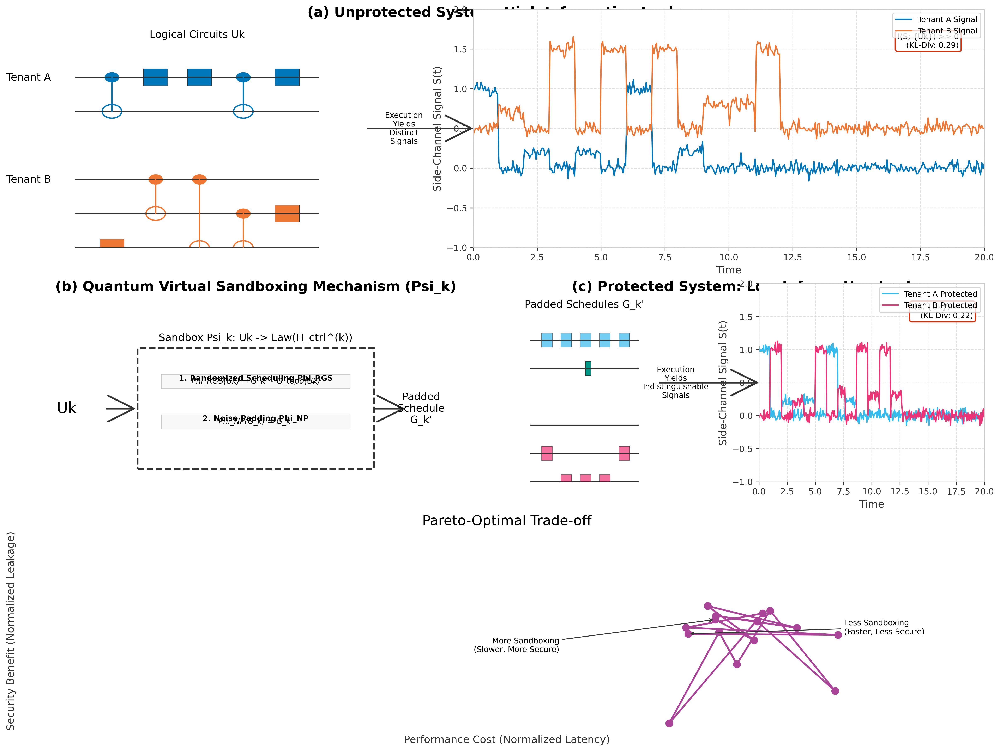

2025-08-29 14:00:48,923 - INFO - Total execution time: 7.83 seconds.


In [7]:
import os
import sys
import logging
import time
from typing import (List, Dict, Tuple, Set, Any, Optional, Union, Callable,
                    Sequence, Generator)
from abc import ABC, abstractmethod
from enum import Enum
import random
import itertools
try:
    import numpy as np
    from numpy.typing import NDArray
    from scipy.linalg import expm, kron
    from scipy.integrate import solve_ivp
    import matplotlib
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Rectangle, ConnectionPatch, ArrowStyle, FancyArrowPatch
    from matplotlib.lines import Line2D
    import networkx as nx
except ImportError as e:
    print(f"Error: Missing required library. {e}")
    print("Please install the necessary packages by running:")
    print("pip install numpy matplotlib scipy networkx")
    sys.exit(1)

class GlobalConfig:


    SIMULATION_SEED: int = 42
    NUM_QUBITS_TOTAL: int = 5
    NUM_TENANTS: int = 2
    TIMESTEPS: int = 400
    T_FINAL: float = 20.0 


    HBAR: float = 1.0
    

    GAMMA_DECAY: float = 0.05 
    

    DRIVE_STRENGTH: float = np.pi / 2.0 
    GATE_DURATION: float = 1.0
    

    CIRCUIT_A_GATES: int = 5
    CIRCUIT_B_GATES: int = 7
    

    SIDE_CHANNEL_BASE_NOISE: float = 0.05
    SIDE_CHANNEL_GATE_SIGNAL: Dict[str, float] = {
        'H': 0.3, 'X': 0.3, 'Z': 0.2, 'CNOT': 1.0, 'IDLE': 0.1, 'PADDING': 0.4
    }
    

    SANDBOXING_ENABLED: bool = True
    PADDING_PROBABILITY: float = 0.3
    PADDING_GATE_TYPE: str = 'Z'
    

    PARETO_POINTS: int = 15
    PARETO_MAX_LATENCY_PENALTY: float = 1.0
    PARETO_MAX_LEAKAGE_PENALTY: float = 1.0
    


    DPI: int = 300
    FONT_SIZE_TITLE: int = 16
    FONT_SIZE_LABEL: int = 12
    FONT_SIZE_TICKS: int = 10
    FONT_SIZE_ANNOTATION: int = 9
    USE_LATEX_FONT: bool = False
    

    COLOR_PALETTE: Dict[str, str] = {
        'tenant_a': '#0077BB',       # Blue
        'tenant_b': '#EE7733',       # Orange
        'adversary': '#CC3311',      # Red
        'protected_a': '#33BBEE',    # Cyan
        'protected_b': '#EE3377',    # Magenta
        'background': '#F0F0F0',
        'text': '#333333',
        'grid': '#CCCCCC',
        'padding_gate': '#009988',   # Teal
        'pareto_frontier': '#AA4499',# Purple
    }


logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s - %(levelname)s - %(message)s')


def setup_matplotlib():

    if GlobalConfig.USE_LATEX_FONT:
        try:
            plt.rc('text', usetex=True)
            plt.rc('font', family='serif', serif=['Computer Modern Roman'])
        except RuntimeError:
            logging.warning("LaTeX not found. Falling back to default font.")
            plt.rc('text', usetex=False)
            plt.rc('font', family='sans-serif')
    else:
        plt.rc('text', usetex=False)
        plt.rc('font', family='sans-serif')
    
    plt.rc('figure', dpi=GlobalConfig.DPI)
    plt.rc('axes', titlesize=GlobalConfig.FONT_SIZE_LABEL, 
           labelsize=GlobalConfig.FONT_SIZE_LABEL, 
           labelcolor=GlobalConfig.COLOR_PALETTE['text'],
           edgecolor=GlobalConfig.COLOR_PALETTE['grid'])
    plt.rc('xtick', labelsize=GlobalConfig.FONT_SIZE_TICKS, 
           color=GlobalConfig.COLOR_PALETTE['text'])
    plt.rc('ytick', labelsize=GlobalConfig.FONT_SIZE_TICKS, 
           color=GlobalConfig.COLOR_PALETTE['text'])
    plt.rc('legend', fontsize=GlobalConfig.FONT_SIZE_ANNOTATION)



class QuantumUtils:


    SIGMA_X: NDArray[np.complex128] = np.array([[0, 1], [1, 0]], dtype=np.complex128)
    SIGMA_Y: NDArray[np.complex128] = np.array([[0, -1j], [1j, 0]], dtype=np.complex128)
    SIGMA_Z: NDArray[np.complex128] = np.array([[1, 0], [0, -1]], dtype=np.complex128)
    IDENTITY: NDArray[np.complex128] = np.eye(2, dtype=np.complex128)


    PROJ_0: NDArray[np.complex128] = np.array([[1, 0], [0, 0]], dtype=np.complex128)
    PROJ_1: NDArray[np.complex128] = np.array([[0, 0], [0, 1]], dtype=np.complex128)


    GATE_H: NDArray[np.complex128] = (1 / np.sqrt(2)) * np.array([[1, 1], [1, -1]], dtype=np.complex128)
    GATE_X: NDArray[np.complex128] = SIGMA_X
    GATE_Z: NDArray[np.complex128] = SIGMA_Z

    GATE_MAP: Dict[str, NDArray[np.complex128]] = {
        'H': GATE_H,
        'X': GATE_X,
        'Z': GATE_Z,
        'I': IDENTITY
    }
    
    @staticmethod
    def get_operator(total_qubits: int, op: NDArray[np.complex128], target_qubit: int) -> NDArray[np.complex128]:

        if not (0 <= target_qubit < total_qubits):
            raise ValueError("Target qubit index is out of bounds.")

        op_list = [QuantumUtils.IDENTITY] * total_qubits
        op_list[target_qubit] = op
        
        full_op = op_list[0]
        for i in range(1, total_qubits):
            full_op = np.kron(full_op, op_list[i])
            
        return full_op

    @staticmethod
    def get_cnot_operator(total_qubits: int, control: int, target: int) -> NDArray[np.complex128]:

        if control == target:
            raise ValueError("Control and target qubits cannot be the same.")
        if not (0 <= control < total_qubits and 0 <= target < total_qubits):
            raise ValueError("Qubit indices are out of bounds.")

        term1_list = [QuantumUtils.IDENTITY] * total_qubits
        term1_list[control] = QuantumUtils.PROJ_0
        
        term2_list = [QuantumUtils.IDENTITY] * total_qubits
        term2_list[control] = QuantumUtils.PROJ_1
        term2_list[target] = QuantumUtils.SIGMA_X
        
        term1 = term1_list[0]
        term2 = term2_list[0]
        for i in range(1, total_qubits):
            term1 = np.kron(term1, term1_list[i])
            term2 = np.kron(term2, term2_list[i])
            
        return term1 + term2

    @staticmethod
    def get_initial_state(total_qubits: int) -> NDArray[np.complex128]:

        psi0 = np.zeros(2**total_qubits, dtype=np.complex128)
        psi0[0] = 1.0
        rho0 = np.outer(psi0, psi0.conj())
        return rho0

    @staticmethod
    def partial_trace(rho: NDArray[np.complex128], keep: List[int], dims: List[int]) -> NDArray[np.complex128]:

        num_qubits = len(dims)
        keep = np.asarray(keep)
        

        rho_tensor = rho.reshape(dims + dims)
        

        trace_axes = np.delete(np.arange(num_qubits), keep)
        

        trace_pairs = np.array([trace_axes, trace_axes + num_qubits]).T.flatten()
        

        reduced_rho = np.einsum(rho_tensor, range(2 * num_qubits),
                                out=None, axes_to_sum=trace_pairs)
        

        new_dims = np.array(dims)[keep]
        return reduced_rho.reshape(np.prod(new_dims), np.prod(new_dims))
        
    @staticmethod
    def kl_divergence(p: NDArray[np.float64], q: NDArray[np.float64]) -> float:


        epsilon = 1e-10
        p_norm = p / np.sum(p) + epsilon
        q_norm = q / np.sum(q) + epsilon
        return np.sum(p_norm * np.log(p_norm / q_norm))


class SimulationError(Exception):

    pass



class Gate:

    
    def __init__(self, name: str, targets: Union[int, List[int]], 
                 controls: Optional[List[int]] = None, 
                 duration: float = GlobalConfig.GATE_DURATION):
        self.name = name.upper()
        self.targets = [targets] if isinstance(targets, int) else targets
        self.controls = controls if controls is not None else []
        self.duration = duration
        self.qubits = sorted(list(set(self.targets + self.controls)))
        self.uid = f"{self.name}_{'_'.join(map(str, self.qubits))}_{id(self)}"

    def __repr__(self) -> str:
        return f"Gate(name='{self.name}', targets={self.targets}, controls={self.controls})"
        
    def get_hamiltonian(self, total_qubits: int) -> NDArray[np.complex128]:

        if self.name in ['H', 'X', 'Z']:

            base_op = QuantumUtils.GATE_MAP[self.name]
            return QuantumUtils.get_operator(total_qubits, base_op, self.targets[0])
        elif self.name == 'CNOT':
            return QuantumUtils.get_cnot_operator(total_qubits, self.controls[0], self.targets[0])
        elif self.name in ['I', 'IDLE', 'PADDING']:
            return np.zeros((2**total_qubits, 2**total_qubits), dtype=np.complex128)
        else:
            raise NotImplementedError(f"Hamiltonian for gate '{self.name}' is not defined.")
            
    def get_unitary(self, total_qubits: int) -> NDArray[np.complex128]:

        if self.name in ['H', 'X', 'Z', 'I']:
            base_op = QuantumUtils.GATE_MAP[self.name]
            return QuantumUtils.get_operator(total_qubits, base_op, self.targets[0])
        elif self.name == 'CNOT':
            return QuantumUtils.get_cnot_operator(total_qubits, self.controls[0], self.targets[0])
        elif self.name in ['IDLE', 'PADDING']:

            return np.eye(2**total_qubits, dtype=np.complex128)
        else:
            raise NotImplementedError(f"Unitary for gate '{self.name}' not implemented.")


class QuantumCircuit:

    def __init__(self, num_qubits: int, name: str):
        self.num_qubits = num_qubits
        self.name = name
        self.dag = nx.DiGraph()
        self.qubit_frontiers = {q: 'START' for q in range(num_qubits)}
        self.dag.add_node('START', gate=None)
        self.dag.add_node('END', gate=None)
        self.gate_count = 0

    def add_gate(self, gate: Gate):

        node_id = f"gate_{self.gate_count}_{gate.name}"
        self.dag.add_node(node_id, gate=gate)
        
        for q in gate.qubits:
            predecessor_node = self.qubit_frontiers[q]
            self.dag.add_edge(predecessor_node, node_id)
            self.qubit_frontiers[q] = node_id
            
        self.gate_count += 1
        
    def finalize(self):

        for node in self.dag.nodes():
            if node not in ['START', 'END'] and self.dag.out_degree(node) == 0:
                self.dag.add_edge(node, 'END')

    def get_all_topological_sorts(self) -> List[List[Gate]]:


        subgraph_nodes = [n for n in self.dag.nodes if n not in ('START', 'END')]
        subgraph = self.dag.subgraph(subgraph_nodes)
        

        valid_schedules = []
        all_perms = list(itertools.permutations(subgraph.nodes))
        for p in all_perms:
            is_valid = True
            for i, u in enumerate(p):
                for j, v in enumerate(p):
                    if i < j and nx.has_path(self.dag, v, u):
                        is_valid = False
                        break
                if not is_valid:
                    break
            if is_valid:
                schedule_nodes = list(p)
                valid_schedules.append([self.dag.nodes[n]['gate'] for n in schedule_nodes])
                

        if not valid_schedules and list(subgraph.nodes):
            try:
                single_sort = list(nx.topological_sort(self.dag))

                gate_nodes = [n for n in single_sort if n not in ('START', 'END')]
                valid_schedules.append([self.dag.nodes[n]['gate'] for n in gate_nodes])
            except nx.NetworkXUnfeasible:
                logging.error("Circuit contains a cycle, cannot be sorted.")
                return []
        
        return valid_schedules

    @classmethod
    def generate_random_circuit(cls, num_qubits: int, num_gates: int, name: str) -> 'QuantumCircuit':

        qc = cls(num_qubits, name)
        
        available_gates_1q = ['H', 'X', 'Z']
        
        for _ in range(num_gates):

            if num_qubits > 1 and random.random() > 0.4:

                q1, q2 = random.sample(range(num_qubits), 2)
                gate = Gate('CNOT', targets=[q2], controls=[q1])
            else:

                q = random.randint(0, num_qubits - 1)
                gate_name = random.choice(available_gates_1q)
                gate = Gate(gate_name, targets=[q])
            qc.add_gate(gate)
        
        qc.finalize()
        return qc


class Tenant:

    
    def __init__(self, tenant_id: str, circuit: QuantumCircuit):
        self.id = tenant_id
        self.circuit = circuit
        self.qubit_indices: List[int] = [] 

    def assign_qubits(self, indices: List[int]):

        if len(indices) != self.circuit.num_qubits:
            raise ValueError("Number of assigned indices must match circuit's qubit count.")
        self.qubit_indices = indices


class QuantumHardwareSimulator:

    
    def __init__(self, total_qubits: int):
        self.total_qubits = total_qubits
        self.hilbert_space_dim = 2**total_qubits
        self.rho: NDArray[np.complex128] = QuantumUtils.get_initial_state(total_qubits)
        self.time_points: NDArray[np.float64] = np.linspace(0, GlobalConfig.T_FINAL, GlobalConfig.TIMESTEPS)
        self._setup_noise_operators()

    def _setup_noise_operators(self):

        self.dissipators: List[NDArray[np.complex128]] = []

        sigma_minus = (QuantumUtils.SIGMA_X - 1j * QuantumUtils.SIGMA_Y) / 2.0
        for i in range(self.total_qubits):
            L = np.sqrt(GlobalConfig.GAMMA_DECAY) * QuantumUtils.get_operator(
                self.total_qubits, sigma_minus, i
            )
            self.dissipators.append(L)

    def _lindblad_master_equation(self, t: float, rho_flat: NDArray[np.complex128], 
                                  H: NDArray[np.complex128]) -> NDArray[np.complex128]:

        rho = rho_flat.reshape((self.hilbert_space_dim, self.hilbert_space_dim))
        

        commutator = H @ rho - rho @ H
        unitary_part = -1j * commutator / GlobalConfig.HBAR
        

        dissipative_part = np.zeros_like(rho, dtype=np.complex128)
        for L in self.dissipators:
            L_dag = L.conj().T
            L_dag_L = L_dag @ L
            term1 = L @ rho @ L_dag
            term2 = -0.5 * (L_dag_L @ rho + rho @ L_dag_L)
            dissipative_part += term1 + term2
            
        d_rho_dt = unitary_part + dissipative_part
        return d_rho_dt.flatten()
        
    def evolve_state(self, H_func: Callable[[float], NDArray[np.complex128]], 
                     t_span: Tuple[float, float]) -> NDArray[np.complex128]:

        def master_equation_with_time_dep_H(t, rho_flat):
            H = H_func(t)
            return self._lindblad_master_equation(t, rho_flat, H)

        sol = solve_ivp(
            master_equation_with_time_dep_H,
            t_span,
            self.rho.flatten(),
            t_eval=[t_span[1]], 
            method='RK45'
        )
        
        final_rho_flat = sol.y[:, -1]
        self.rho = final_rho_flat.reshape((self.hilbert_space_dim, self.hilbert_space_dim))
        return self.rho

    def reset(self):

        self.rho = QuantumUtils.get_initial_state(self.total_qubits)



class Sandboxer:

    
    @staticmethod
    def randomize_schedule(circuit: QuantumCircuit) -> List[Gate]:

        all_schedules = circuit.get_all_topological_sorts()
        if not all_schedules:
            logging.warning(f"No valid schedules found for circuit {circuit.name}. Returning empty list.")
            return []
        return random.choice(all_schedules)

    @staticmethod
    def add_noise_padding(schedule: List[Gate], probability: float) -> List[Gate]:

        padded_schedule: List[Gate] = []
        for gate in schedule:
            padded_schedule.append(gate)

            if random.random() < probability:

                target_qubit = random.choice(gate.qubits)
                padding_gate = Gate('PADDING', targets=[target_qubit], 
                                    duration=gate.duration * (0.2 + 0.6 * random.random()))
                padded_schedule.append(padding_gate)
        return padded_schedule


class MultiTenantScheduler:

    
    def __init__(self, tenants: List[Tenant], total_qubits: int):
        self.tenants = tenants
        self.total_qubits = total_qubits
        self._assign_qubits()
        
    def _assign_qubits(self):


        qubit_indices = list(range(self.total_qubits))
        current_idx = 0
        for tenant in self.tenants:
            num_tenant_qubits = tenant.circuit.num_qubits
            if current_idx + num_tenant_qubits > self.total_qubits:
                raise SimulationError("Not enough qubits on hardware for all tenants.")
            
            assigned = qubit_indices[current_idx : current_idx + num_tenant_qubits]
            tenant.assign_qubits(assigned)
            current_idx += num_tenant_qubits
            
    def _map_gate_to_physical(self, tenant: Tenant, gate: Gate) -> Gate:

        physical_targets = [tenant.qubit_indices[q] for q in gate.targets]
        physical_controls = [tenant.qubit_indices[q] for q in gate.controls]
        return Gate(gate.name, targets=physical_targets, controls=physical_controls, duration=gate.duration)

    def create_schedule(self, sandbox: bool) -> List[Tuple[float, Gate]]:

        schedules: Dict[str, List[Gate]] = {}
        for tenant in self.tenants:

            if sandbox:
                schedule = Sandboxer.randomize_schedule(tenant.circuit)
            else:

                schedule = tenant.circuit.get_all_topological_sorts()[0]
                

            if sandbox:
                schedule = Sandboxer.add_noise_padding(schedule, GlobalConfig.PADDING_PROBABILITY)
            
            schedules[tenant.id] = schedule

        full_schedule: List[Gate] = []
        mapped_schedules = {
            tenant.id: [self._map_gate_to_physical(tenant, g) for g in schedules[tenant.id]]
            for tenant in self.tenants
        }
        
        indices = {tid: 0 for tid in mapped_schedules.keys()}
        tenant_ids = list(mapped_schedules.keys())
        
        while any(indices[tid] < len(mapped_schedules[tid]) for tid in tenant_ids):
            for tid in tenant_ids:
                if indices[tid] < len(mapped_schedules[tid]):
                    full_schedule.append(mapped_schedules[tid][indices[tid]])
                    indices[tid] += 1
                    
        timed_schedule: List[Tuple[float, Gate]] = []
        current_time = 0.0
        for gate in full_schedule:
            timed_schedule.append((current_time, gate))
            current_time += gate.duration
            
        return timed_schedule

class SimulationOrchestrator:

    
    def __init__(self, config: GlobalConfig):
        self.config = config
        self.setup_environment()
        
    def setup_environment(self):

        logging.info("Setting up simulation environment...")
        random.seed(self.config.SIMULATION_SEED)
        np.random.seed(self.config.SIMULATION_SEED)
        

        self.circuit_a = QuantumCircuit.generate_random_circuit(
            num_qubits=2, num_gates=self.config.CIRCUIT_A_GATES, name="Victim"
        )
        self.circuit_b = QuantumCircuit.generate_random_circuit(
            num_qubits=3, num_gates=self.config.CIRCUIT_B_GATES, name="Adversary"
        )
        
        self.tenant_a = Tenant(tenant_id="A", circuit=self.circuit_a)
        self.tenant_b = Tenant(tenant_id="B", circuit=self.circuit_b)
        
        self.tenants = [self.tenant_a, self.tenant_b]
        

        self.hardware = QuantumHardwareSimulator(self.config.NUM_QUBITS_TOTAL)
        

        self.scheduler = MultiTenantScheduler(self.tenants, self.config.NUM_QUBITS_TOTAL)
        logging.info("Environment setup complete.")

    def _generate_side_channel_signal(self, schedule: List[Tuple[float, Gate]]) -> Tuple[NDArray[np.float64], NDArray[np.float64]]:

        time_points = self.hardware.time_points
        signal = np.zeros_like(time_points)
        
        gate_idx = 0
        for i, t in enumerate(time_points):
            base_noise = np.random.normal(0, self.config.SIDE_CHANNEL_BASE_NOISE)
            
            active_gate_signal = 0.0
            if gate_idx < len(schedule):
                gate_start_time, gate = schedule[gate_idx]
                gate_end_time = gate_start_time + gate.duration
                
                if gate_start_time <= t < gate_end_time:
                    gate_type = gate.name
                    if gate_type == 'PADDING':
                         active_gate_signal = self.config.SIDE_CHANNEL_GATE_SIGNAL.get('PADDING', 0.1)
                    else:
                        active_gate_signal = self.config.SIDE_CHANNEL_GATE_SIGNAL.get(gate.name, 0.1)
                elif t >= gate_end_time:
                    gate_idx += 1
            
            signal[i] = base_noise + active_gate_signal
            
        return time_points, signal

    def run_simulation_scenario(self, sandbox: bool) -> Dict[str, Any]:

        logging.info(f"Running simulation scenario: Sandboxing={'Enabled' if sandbox else 'Disabled'}")
        

        self.hardware.reset()
        

        schedule = self.scheduler.create_schedule(sandbox=sandbox)
        
        def filter_schedule(tenant_id: str):
            return [(t, g) for t, g in schedule if 
                    set(g.qubits).issubset(set(getattr(self, f'tenant_{tenant_id.lower()}').qubit_indices))]

        schedule_a = filter_schedule('A')
        schedule_b = filter_schedule('B')
        
        t, signal_a = self._generate_side_channel_signal(schedule_a)
        _, signal_b = self._generate_side_channel_signal(schedule_b)
        
        total_latency = schedule[-1][0] + schedule[-1][1].duration if schedule else 0
        

        hist_a, _ = np.histogram(signal_a, bins=50, range=(-0.5, 1.5), density=True)
        hist_b, _ = np.histogram(signal_b, bins=50, range=(-0.5, 1.5), density=True)
        
        leakage = QuantumUtils.kl_divergence(hist_a, hist_b)
        
        logging.info(f"Scenario complete. Latency: {total_latency:.2f}, Leakage (KL-Div): {leakage:.4f}")
        
        return {
            "time_points": t,
            "signal_a": signal_a,
            "signal_b": signal_b,
            "schedule": schedule,
            "latency": total_latency,
            "leakage": leakage
        }

    def run_pareto_analysis(self) -> Tuple[List[float], List[float]]:

        logging.info("Running Pareto frontier analysis...")
        latencies = []
        leakages = []


        padding_probabilities = np.linspace(0.0, 0.8, self.config.PARETO_POINTS)
        original_padding_prob = self.config.PADDING_PROBABILITY
        
        for prob in padding_probabilities:
            self.config.PADDING_PROBABILITY = prob

            results = self.run_simulation_scenario(sandbox=True)
            latencies.append(results['latency'])
            leakages.append(results['leakage'])


        self.config.PADDING_PROBABILITY = original_padding_prob
        logging.info("Pareto analysis complete.")


        max_latency = max(latencies) if latencies else 1
        max_leakage = max(leakages) if leakages else 1

        performance_cost = [l / max_latency for l in latencies]
        security_cost = [1 - (lk / max_leakage) for lk in leakages]
        
        return performance_cost, security_cost


class VisualizationEngine:

    
    def __init__(self, config: GlobalConfig, unprotected_data: Dict[str, Any], protected_data: Dict[str, Any], pareto_data: Tuple, circuits: Dict[str, QuantumCircuit]):
        self.config = config
        self.unprotected_data = unprotected_data
        self.protected_data = protected_data
        self.pareto_data = pareto_data
        self.circuits = circuits
        setup_matplotlib()
        self.fig = plt.figure(figsize=(16, 12), constrained_layout=True)
        self.gs = gridspec.GridSpec(3, 2, figure=self.fig, height_ratios=[1.2, 1, 1], width_ratios=[1, 1])
        self.colors = self.config.COLOR_PALETTE

    def _create_panel_box(self, ax: plt.Axes, title: str):

        ax.set_title(title, fontsize=self.config.FONT_SIZE_TITLE, fontweight='bold', pad=20)
        ax.set_xticks([])
        ax.set_yticks([])

        for spine in ax.spines.values():
            spine.set_visible(False)

    def _plot_signal(self, ax: plt.Axes, t: NDArray, signal: NDArray, color: str, label: str):

        ax.plot(t, signal, color=color, lw=1.5, label=label)
        ax.set_xlabel("Time", fontsize=self.config.FONT_SIZE_LABEL)
        ax.set_ylabel("Side-Channel Signal S(t)", fontsize=self.config.FONT_SIZE_LABEL)
        ax.tick_params(axis='both', which='major', labelsize=self.config.FONT_SIZE_TICKS)
        ax.grid(True, linestyle='--', color=self.colors['grid'], alpha=0.6)
        ax.set_xlim(0, max(self.unprotected_data['time_points'][-1], self.protected_data['time_points'][-1]))
        ax.set_ylim(-1.0, 2.0)

    def _draw_abstract_circuit(self, ax: plt.Axes, circuit_name: str, y_pos: float):

        num_qubits = self.circuits[circuit_name].num_qubits
        ax.text(-0.1, y_pos, f'Tenant {circuit_name}', ha='right', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        for i in range(num_qubits):
            ax.plot([0, 1], [y_pos - i*0.2, y_pos - i*0.2], color=self.colors['text'], lw=1)
        
        gate_seq = self.circuits[circuit_name].get_all_topological_sorts()[0]
        for i, gate in enumerate(gate_seq[:5]): 
            x = 0.1 + i * 0.18
            if len(gate.qubits) == 1:
                q_idx = gate.targets[0]
                ax.add_patch(Rectangle((x, y_pos - q_idx*0.2 - 0.05), 0.1, 0.1, facecolor=self.colors[f'tenant_{circuit_name.lower()}'], edgecolor=self.colors['text'], lw=0.5))
            else: # CNOT
                c, t = gate.controls[0], gate.targets[0]
                ax.plot([x+0.05, x+0.05], [y_pos - c*0.2, y_pos - t*0.2], color=self.colors[f'tenant_{circuit_name.lower()}'], lw=1.5)
                ax.add_patch(plt.Circle((x+0.05, y_pos - c*0.2), 0.03, facecolor=self.colors[f'tenant_{circuit_name.lower()}']))
                ax.add_patch(plt.Circle((x+0.05, y_pos - t*0.2), 0.04, facecolor='none', edgecolor=self.colors[f'tenant_{circuit_name.lower()}'], lw=1.5))

    def plot_panel_a(self):

        ax_main = self.fig.add_subplot(self.gs[0, :])
        self._create_panel_box(ax_main, '(a) Unprotected System: High Information Leakage')
        
        gs_inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=self.gs[0, :], width_ratios=[0.8, 1.2])


        ax_circ = self.fig.add_subplot(gs_inner[0])
        ax_circ.set_xlim(-0.2, 1.2)
        ax_circ.set_ylim(-0.2, 1.2)
        ax_circ.axis('off')
        ax_circ.text(0.5, 1.05, 'Logical Circuits Uk', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        self._draw_abstract_circuit(ax_circ, 'A', 0.8)
        self._draw_abstract_circuit(ax_circ, 'B', 0.2)
        

        ax_sig = self.fig.add_subplot(gs_inner[1])
        self._plot_signal(ax_sig, self.unprotected_data['time_points'], 
                          self.unprotected_data['signal_a'], self.colors['tenant_a'], 'Tenant A Signal')
        self._plot_signal(ax_sig, self.unprotected_data['time_points'], 
                          self.unprotected_data['signal_b'] + 0.5, self.colors['tenant_b'], 'Tenant B Signal')
        ax_sig.legend(loc='upper right')
        

        leakage = self.unprotected_data['leakage']
        ax_sig.text(0.95, 0.9, f'I(S; {{Uk}}) >> 0\n(KL-Div: {leakage:.2f})', transform=ax_sig.transAxes, ha='right', va='top', fontsize=self.config.FONT_SIZE_ANNOTATION, bbox=dict(boxstyle="round,pad=0.3", fc='white', ec=self.colors['adversary'], lw=1.5))
        

        con = ConnectionPatch(xyA=(1.2, 0.5), xyB=(0, 0.5), coordsA=ax_circ.transData, coordsB=ax_sig.transData, arrowstyle="->,head_length=1,head_width=0.5", lw=2, color=self.colors['text'], mutation_scale=30)
        self.fig.add_artist(con)
        ax_circ.text(1.35, 0.5, 'Execution\nYields\nDistinct\nSignals', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION)
    
    def plot_panel_b(self):
 
        ax = self.fig.add_subplot(self.gs[1, 0])
        self._create_panel_box(ax, '(b) Quantum Virtual Sandboxing Mechanism (Psi_k)')
        ax.set_xlim(0, 10)
        ax.set_ylim(0, 10)
        

        ax.add_patch(Rectangle((2.5, 2), 5, 6, facecolor='white', edgecolor=self.colors['text'], lw=2, ls='--'))
        ax.text(5, 8.5, 'Sandbox Psi_k: Uk -> Law(H_ctrl^(k))', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)


        ax.text(1, 5, 'Uk', ha='center', va='center', fontsize=18)
        ax.add_artist(FancyArrowPatch((1.8, 5), (2.5, 5), arrowstyle='->,head_length=1,head_width=0.5', color=self.colors['text'], lw=2, mutation_scale=30))
        

        ax.text(5, 6.5, '1. Randomized Scheduling Phi_RGS', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, fontweight='bold')
        ax.add_patch(Rectangle((3, 6), 4, 0.7, facecolor='#F8F8F8', edgecolor=self.colors['grid'], lw=0.5))
        ax.text(5, 6.35, 'Phi_RGS(Uk) = G_k ~ G_topo(Uk)', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, style='italic')
        

        ax.text(5, 4.5, '2. Noise Padding Phi_NP', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, fontweight='bold')
        ax.add_patch(Rectangle((3, 4), 4, 0.7, facecolor='#F8F8F8', edgecolor=self.colors['grid'], lw=0.5))
        ax.text(5, 4.35, 'Phi_NP(G_k) = G_k\'', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION, style='italic')
        

        ax.text(8.5, 5, 'Padded\nSchedule\nG_k\'', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        ax.add_artist(FancyArrowPatch((7.5, 5), (8.2, 5), arrowstyle='->,head_length=1,head_width=0.5', color=self.colors['text'], lw=2, mutation_scale=30))

    def plot_panel_c(self):

        ax_main = self.fig.add_subplot(self.gs[1, 1])
        self._create_panel_box(ax_main, '(c) Protected System: Low Information Leakage')

        gs_inner = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=self.gs[1, 1], width_ratios=[0.8, 1.2])


        ax_circ = self.fig.add_subplot(gs_inner[0])
        ax_circ.set_xlim(-0.2, 1.2)
        ax_circ.set_ylim(-0.2, 1.2)
        ax_circ.axis('off')
        ax_circ.text(0.5, 1.05, 'Padded Schedules G_k\'', ha='center', va='center', fontsize=self.config.FONT_SIZE_LABEL)
        

        for y_pos, tenant_color in zip([0.8, 0.2], [self.colors['protected_a'], self.colors['protected_b']]):
            num_qubits = 2 if y_pos == 0.8 else 3
            for i in range(num_qubits):
                ax_circ.plot([0, 1], [y_pos - i*0.2, y_pos - i*0.2], color=self.colors['text'], lw=1)
            
            for i in range(5):
                x = 0.1 + i * 0.18
                if random.random() < 0.3: 
                    ax_circ.add_patch(Rectangle((x+0.05, y_pos - (random.randint(0, num_qubits-1))*0.2 - 0.05), 0.05, 0.1, facecolor=self.colors['padding_gate'], edgecolor=self.colors['text'], lw=0.5))
                ax_circ.add_patch(Rectangle((x, y_pos - (random.randint(0, num_qubits-1))*0.2 - 0.05), 0.1, 0.1, facecolor=tenant_color, edgecolor=self.colors['text'], lw=0.5, alpha=0.7))


        ax_sig = self.fig.add_subplot(gs_inner[1])
        self._plot_signal(ax_sig, self.protected_data['time_points'], 
                          self.protected_data['signal_a'], self.colors['protected_a'], 'Tenant A Protected')
        self._plot_signal(ax_sig, self.protected_data['time_points'], 
                          self.protected_data['signal_b'], self.colors['protected_b'], 'Tenant B Protected')
        ax_sig.legend(loc='upper right')
        

        leakage = self.protected_data['leakage']
        ax_sig.text(0.95, 0.9, f'I(S; {{Uk}}) ~= 0\n(KL-Div: {leakage:.2f})', transform=ax_sig.transAxes, ha='right', va='top', fontsize=self.config.FONT_SIZE_ANNOTATION, bbox=dict(boxstyle="round,pad=0.3", fc='white', ec=self.colors['adversary'], lw=1.5))
        

        con = ConnectionPatch(xyA=(1.2, 0.5), xyB=(0, 0.5), coordsA=ax_circ.transData, coordsB=ax_sig.transData, arrowstyle="->,head_length=1,head_width=0.5", lw=2, color=self.colors['text'], mutation_scale=30)
        self.fig.add_artist(con)
        ax_circ.text(1.35, 0.5, 'Execution\nYields\nIndistinguishable\nSignals', ha='center', va='center', fontsize=self.config.FONT_SIZE_ANNOTATION)

    def plot_panel_d(self):

        ax = self.fig.add_subplot(self.gs[2, :])
        self._create_panel_box(ax, '(d) Pareto-Optimal Frontier')
        
        perf_cost, sec_cost = self.pareto_data
        

        ax.plot(perf_cost, sec_cost, 'o-', color=self.colors['pareto_frontier'], lw=2, ms=8, label='Pareto Frontier')
        

        ax.annotate('Less Sandboxing\n(Faster, Less Secure)', xy=(perf_cost[0], sec_cost[0]), xytext=(perf_cost[0]+0.2, sec_cost[0]), arrowprops=dict(arrowstyle="->", color=self.colors['text']), fontsize=self.config.FONT_SIZE_ANNOTATION)
        ax.annotate('More Sandboxing\n(Slower, More Secure)', xy=(perf_cost[-1], sec_cost[-1]), xytext=(perf_cost[-1]-0.2, sec_cost[-1]-0.2), arrowprops=dict(arrowstyle="->", color=self.colors['text']), fontsize=self.config.FONT_SIZE_ANNOTATION, ha='right')

        ax.set_xlabel('Performance Cost (Normalized Latency)', fontsize=self.config.FONT_SIZE_LABEL)
        ax.set_ylabel('Security Benefit (Normalized Leakage)', fontsize=self.config.FONT_SIZE_LABEL)
        ax.grid(True, linestyle='--', color=self.colors['grid'], alpha=0.6)
        ax.set_xlim(-0.05, 1.2)
        ax.set_ylim(-0.05, 1.2)
        ax.set_title('Pareto-Optimal Trade-off', fontsize=self.config.FONT_SIZE_TITLE)
        
    def render_and_save(self):

        logging.info("Rendering and saving the final figure...")
        self.plot_panel_a()
        self.plot_panel_b()
        self.plot_panel_c()
        self.plot_panel_d()
        

        plt.show()


def main():

    start_time = time.time()
    

    config = GlobalConfig()
    

    orchestrator = SimulationOrchestrator(config=config)
    unprotected_results = orchestrator.run_simulation_scenario(sandbox=False)
    protected_results = orchestrator.run_simulation_scenario(sandbox=True)
    

    pareto_results = orchestrator.run_pareto_analysis()
    

    visualizer = VisualizationEngine(
        config=config,
        unprotected_data=unprotected_results,
        protected_data=protected_results,
        pareto_data=pareto_results,
        circuits={'A': orchestrator.circuit_a, 'B': orchestrator.circuit_b}
    )
    

    visualizer.render_and_save()
    
    end_time = time.time()
    logging.info(f"Total execution time: {end_time - start_time:.2f} seconds.")

main()

In [23]:
import os
import sys
import time
import random
import logging
import math
import argparse
import itertools
from collections import namedtuple, deque, defaultdict
from abc import ABC, abstractmethod
from typing import List, Dict, Tuple, Set, Optional, Any, Union


import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.colors as mcolors
from matplotlib.cm import get_cmap
from scipy.ndimage import gaussian_filter
from scipy.spatial.distance import cdist
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import dijkstra
try:
    from noise import pnoise2
except ImportError:
    print("Warning: 'noise' library not found. Perlin noise model will not work. Please install it with 'pip install noise'.")
    pnoise2 = None
try:
    from sklearn.mixture import GaussianMixture
except ImportError:
    print("Warning: 'scikit-learn' library not found. Some functionality may be limited. Please install it with 'pip install scikit-learn'.")
    GaussianMixture = None

np.random.seed(42)
random.seed(42)

class SimulationLogger:

    _instance = None

    def __new__(cls, *args, **kwargs):
        if not cls._instance:
            cls._instance = super(SimulationLogger, cls).__new__(cls)
        return cls._instance

    def __init__(self, log_level=logging.INFO, log_file="simulation.log"):
        self.log_level = log_level
        self.log_file = log_file
        self.logger = logging.getLogger("SecureHyperQSim")
        self._configure_logger()

    def _configure_logger(self):

        if not self.logger.handlers:
            self.logger.setLevel(self.log_level)


            console_handler = logging.StreamHandler(sys.stdout)
            console_formatter = logging.Formatter(
                '%(asctime)s - [%(levelname)s] - %(message)s',
                datefmt='%Y-%m-%d %H:%M:%S'
            )
            console_handler.setFormatter(console_formatter)
            self.logger.addHandler(console_handler)


            file_handler = logging.FileHandler(self.log_file, mode='w')
            file_formatter = logging.Formatter(
                '%(asctime)s - %(name)s - [%(levelname)s] - %(module)s.%(funcName)s:%(lineno)d - %(message)s'
            )
            file_handler.setFormatter(file_formatter)
            self.logger.addHandler(file_handler)

    def get_logger(self):
        return self.logger


logger = SimulationLogger(log_level=logging.INFO).get_logger()

logger.info("Logger initialized. Secure HyperQ Simulation starting.")


logger.info("Defining core data structures and types.")


QubitID = int
TenantID = int
Coordinate = Tuple[int, int]
QubitState = Union[None, TenantID]


Qubit = namedtuple('Qubit', ['id', 'coord', 'noise_level'])
Tenant = namedtuple('Tenant', ['id', 'name', 'qubit_req', 'priority', 'internal_graph'])
Placement = namedtuple('Placement', ['tenant_id', 'qubits'])
Schedule = Dict[TenantID, Placement]

class SimulationClock:

    def __init__(self):
        self._start_time = None
        self._stop_time = None

    def start(self, message: str):

        self._start_time = time.perf_counter()
        logger.info(f"TIMER START: {message}")

    def stop(self, message: str):

        if self._start_time is None:
            logger.warning("Timer was stopped without being started.")
            return
        self._stop_time = time.perf_counter()
        elapsed = self._stop_time - self._start_time
        logger.info(f"TIMER STOP: {message} | Elapsed: {elapsed:.4f} seconds.")
        self._start_time = None
        return elapsed


TIMER = SimulationClock()


class Config:

    def __init__(self):
        logger.info("Initializing simulation configuration.")


        self.PROCESSOR_DIMS: Tuple[int, int] = (32, 32)
        self.TOTAL_QUBITS: int = self.PROCESSOR_DIMS[0] * self.PROCESSOR_DIMS[1]


        self.NOISE_MODEL_TYPE: str = 'gaussian_hotspots'
        self.NOISE_BASE_LEVEL: float = 0.001
        self.NOISE_SCALE: float = 10.0
        self.NOISE_OCTAVES: int = 6
        self.NOISE_PERSISTENCE: float = 0.5
        self.NOISE_LACUNARITY: float = 2.0
        self.NUM_HOTSPOTS: int = 5
        self.HOTSPOT_INTENSITY_RANGE: Tuple[float, float] = (0.05, 0.15)
        self.HOTSPOT_STD_DEV_RANGE: Tuple[float, float] = (2.0, 5.0)


        self.NUM_TENANTS: int = 7

        self.TENANT_QUBIT_REQ_RANGE: Tuple[int, int] = (10, 40)
        self.TENANT_PRIORITY_RANGE: Tuple[int, int] = (1, 10)

        self.TENANT_CONNECTIVITY_DENSITY: float = 0.3


        self.SECURITY_BUFFER_DISTANCE: int = 1 

 
        self.LAMBDA_LATENCY: float = 1.5   
        self.LAMBDA_NOISE: float = 5000.0  
        self.LAMBDA_SEPARATION: float = 2.0 


        self.PLACEMENT_STRATEGY: str = 'spiral_search'
        self.SPIRAL_SEARCH_MAX_RADIUS: int = 40
        self.RANDOM_WALK_STEPS: int = 2000


        self.OUTPUT_DPI: int = 300
        self.FIG_SIZE: Tuple[int, int] = (20, 20)
        self.FONT_FAMILY: str = 'serif'
        self.FONT_SIZE_TITLE: int = 28
        self.FONT_SIZE_LABELS: int = 16
        self.FONT_SIZE_ANNOTATIONS: int = 12


        self.NOISE_CMAP = plt.cm.plasma
        self.TENANT_COLORS = self._generate_distinct_colors(self.NUM_TENANTS)
        self.QUBIT_GRID_COLOR: str = 'grey'
        self.BACKGROUND_COLOR: str = '#0a0a1a' 
        self.IDLE_QUBIT_COLOR: str = '#1a1a2e'
        self.BUFFER_QUBIT_COLOR: str = '#2a2a4a'
        self.TEXT_COLOR: str = 'white'
        self.CONNECTIVITY_LINE_COLOR: str = 'cyan'

    @staticmethod
    def _generate_distinct_colors(n: int) -> List[str]:

        cmap = get_cmap('gist_rainbow', n)
        return [mcolors.to_hex(cmap(i)) for i in range(n)]

    def log_config(self):

        logger.info("==================== Configuration ====================")
        for key, value in self.__dict__.items():
            logger.info(f"{key}: {value}")
        logger.info("=======================================================")


CONFIG = Config()



class GeometryUtils:


    @staticmethod
    def coord_to_id(coord: Coordinate, dims: Tuple[int, int]) -> QubitID:

        return coord[0] * dims[1] + coord[1]

    @staticmethod
    def id_to_coord(qubit_id: QubitID, dims: Tuple[int, int]) -> Coordinate:

        if qubit_id >= dims[0] * dims[1]:
            raise ValueError(f"Qubit ID {qubit_id} is out of bounds for dims {dims}.")
        row = qubit_id // dims[1]
        col = qubit_id % dims[1]
        return (row, col)

    @staticmethod
    def manhattan_distance(c1: Coordinate, c2: Coordinate) -> int:

        return abs(c1[0] - c2[0]) + abs(c1[1] - c2[1])

    @staticmethod
    def get_neighbors(coord: Coordinate, dims: Tuple[int, int]) -> List[Coordinate]:

        r, c = coord
        neighbors = []
        for dr, dc in [(0, 1), (0, -1), (1, 0), (-1, 0)]:
            nr, nc = r + dr, c + dc
            if 0 <= nr < dims[0] and 0 <= nc < dims[1]:
                neighbors.append((nr, nc))
        return neighbors

class GraphUtils:


    @staticmethod
    def create_grid_graph(dims: Tuple[int, int]) -> csr_matrix:

        rows, cols = dims
        n_qubits = rows * cols
        adj = np.zeros((n_qubits, n_qubits))

        for r in range(rows):
            for c in range(cols):
                idx1 = GeometryUtils.coord_to_id((r, c), dims)
                neighbors = GeometryUtils.get_neighbors((r, c), dims)
                for neighbor_coord in neighbors:
                    idx2 = GeometryUtils.coord_to_id(neighbor_coord, dims)
                    adj[idx1, idx2] = 1

        return csr_matrix(adj)



class QuantumProcessor:

    def __init__(self, config: Config):
        logger.info("Initializing Quantum Processor model.")
        self.config = config
        self.dims = self.config.PROCESSOR_DIMS
        self.num_qubits = self.config.TOTAL_QUBITS

        self.qubits: Dict[Coordinate, Qubit] = {}
        self.noise_map: np.ndarray = np.zeros(self.dims)
        self.adjacency_graph: csr_matrix = GraphUtils.create_grid_graph(self.dims)

        TIMER.start("Generating hardware noise map")
        self._generate_noise_map()
        TIMER.stop("Noise map generation complete")

        self._initialize_qubits()

    def _generate_noise_map(self):

        if self.config.NOISE_MODEL_TYPE == 'perlin':
            self._generate_perlin_noise()
        elif self.config.NOISE_MODEL_TYPE == 'gaussian_hotspots':
            self._generate_gaussian_hotspots()
        else:
            raise ValueError(f"Unknown noise model type: {self.config.NOISE_MODEL_TYPE}")

        self.noise_map = self.config.NOISE_BASE_LEVEL + self.noise_map
        self.noise_map = np.clip(self.noise_map, 0, np.max(self.noise_map))
        logger.info(f"Noise map generated. Min: {np.min(self.noise_map):.4f}, Max: {np.max(self.noise_map):.4f}, Mean: {np.mean(self.noise_map):.4f}")

    def _generate_perlin_noise(self):

        if pnoise2 is None:
            logger.error("Perlin noise library not found. Falling back to Gaussian Hotspots.")
            self._generate_gaussian_hotspots()
            return

        for r in range(self.dims[0]):
            for c in range(self.dims[1]):
                self.noise_map[r, c] = pnoise2(
                    r / self.config.NOISE_SCALE,
                    c / self.config.NOISE_SCALE,
                    octaves=self.config.NOISE_OCTAVES,
                    persistence=self.config.NOISE_PERSISTENCE,
                    lacunarity=self.config.NOISE_LACUNARITY,
                    base=42
                )

        max_intensity = self.config.HOTSPOT_INTENSITY_RANGE[1]
        self.noise_map = (self.noise_map + 1) / 2 * max_intensity

    def _generate_gaussian_hotspots(self):

        x = np.linspace(0, self.dims[1]-1, self.dims[1])
        y = np.linspace(0, self.dims[0]-1, self.dims[0])
        xx, yy = np.meshgrid(x, y)

        for _ in range(self.config.NUM_HOTSPOTS):
            center_x = np.random.uniform(0, self.dims[1])
            center_y = np.random.uniform(0, self.dims[0])
            std_dev = np.random.uniform(*self.config.HOTSPOT_STD_DEV_RANGE)
            intensity = np.random.uniform(*self.config.HOTSPOT_INTENSITY_RANGE)

            g = intensity * np.exp(-((xx - center_x)**2 + (yy - center_y)**2) / (2 * std_dev**2))
            self.noise_map += g

    def _initialize_qubits(self):

        for r in range(self.dims[0]):
            for c in range(self.dims[1]):
                coord = (r, c)
                qubit_id = GeometryUtils.coord_to_id(coord, self.dims)
                noise = self.noise_map[r, c]
                self.qubits[coord] = Qubit(id=qubit_id, coord=coord, noise_level=noise)

    def get_qubit_at(self, coord: Coordinate) -> Optional[Qubit]:

        return self.qubits.get(coord)



class WorkloadGenerator:

    def __init__(self, config: Config):
        logger.info("Initializing Workload Generator.")
        self.config = config
        self.tenant_names = [f"Tenant-{chr(65+i)}" for i in range(config.NUM_TENANTS)]

    def generate_workload_queue(self) -> deque:

        TIMER.start("Generating tenant workloads")
        tenants = []
        for i in range(self.config.NUM_TENANTS):
            req = np.random.randint(*self.config.TENANT_QUBIT_REQ_RANGE)
            priority = np.random.randint(*self.config.TENANT_PRIORITY_RANGE)
            internal_graph = self._generate_internal_graph(req)

            tenant = Tenant(
                id=i,
                name=self.tenant_names[i],
                qubit_req=req,
                priority=priority,
                internal_graph=internal_graph
            )
            tenants.append(tenant)
            logger.info(f"Generated {tenant.name}: requires {tenant.qubit_req} qubits, priority {tenant.priority}.")


        tenants.sort(key=lambda t: t.priority, reverse=True)
        TIMER.stop("Workload generation complete")
        return deque(tenants)

    def _generate_internal_graph(self, num_qubits: int) -> List[Tuple[int, int]]:

        edges = []
        num_edges = int(0.5 * num_qubits * (num_qubits - 1) * self.config.TENANT_CONNECTIVITY_DENSITY)

        max_possible_edges = num_qubits * (num_qubits - 1) // 2
        num_edges = min(num_edges, max_possible_edges)

        possible_edges = list(itertools.combinations(range(num_qubits), 2))
        if len(possible_edges) > 0:
            selected_indices = np.random.choice(len(possible_edges), num_edges, replace=False)
            edges = [possible_edges[i] for i in selected_indices]

        return edges



class AbstractScheduler(ABC):

    def __init__(self, processor: QuantumProcessor, config: Config):
        self.processor = processor
        self.config = config
        self.qubit_allocations: np.ndarray = np.full(self.processor.dims, -1, dtype=int)

    @abstractmethod
    def schedule(self, workload_queue: deque) -> Schedule:

        pass

    def _is_valid_and_unallocated(self, coord: Coordinate) -> bool:

        r, c = coord
        return 0 <= r < self.processor.dims[0] and \
               0 <= c < self.processor.dims[1] and \
               self.qubit_allocations[r, c] == -1

class SecureHyperQScheduler(AbstractScheduler):

    def schedule(self, workload_queue: deque) -> Schedule:

        logger.info("Starting Secure HyperQ scheduling process.")
        TIMER.start("Total scheduling time")

        final_schedule: Schedule = {}

        while workload_queue:
            tenant = workload_queue.popleft()
            logger.info(f"Attempting to schedule {tenant.name} requiring {tenant.qubit_req} qubits.")

            best_placement = self._find_best_placement_for_tenant(tenant)

            if best_placement:
                logger.info(f"Successfully placed {tenant.name} at cost {best_placement['cost']:.4f}.")
                self._commit_placement(tenant.id, best_placement['coords'])

                qubit_objects = [self.processor.get_qubit_at(c) for c in best_placement['coords']]
                final_schedule[tenant.id] = Placement(tenant_id=tenant.id, qubits=qubit_objects)
            else:
                logger.warning(f"Could not find a suitable placement for {tenant.name}. Not enough contiguous and secure space.")

        TIMER.stop("Scheduling process finished")
        logger.info(f"Successfully scheduled {len(final_schedule)} out of {self.config.NUM_TENANTS} tenants.")
        return final_schedule

    def _find_best_placement_for_tenant(self, tenant: Tenant) -> Optional[Dict[str, Any]]:

        best_placement = {'cost': float('inf'), 'coords': None}

        if self.config.PLACEMENT_STRATEGY == 'spiral_search':
            search_space = self._get_spiral_search_space()
        elif self.config.PLACEMENT_STRATEGY == 'random_walk':
            search_space = self._get_random_walk_search_space()
        else:
            raise ValueError(f"Invalid placement strategy: {self.config.PLACEMENT_STRATEGY}")

        for start_coord in search_space:
            if not self._is_valid_and_unallocated(start_coord):
                continue


            placement_coords = self._grow_region(start_coord, tenant.qubit_req)

            if placement_coords:

                cost = self._calculate_placement_cost(placement_coords, tenant)
                if cost < best_placement['cost']:
                    best_placement['cost'] = cost
                    best_placement['coords'] = placement_coords

        if best_placement['coords']:
            return best_placement
        return None

    def _get_spiral_search_space(self) -> List[Coordinate]:

        center_r, center_c = self.processor.dims[0] // 2, self.processor.dims[1] // 2
        path = [(center_r, center_c)]
        dr, dc = 0, -1
        for i in range(self.config.SPIRAL_SEARCH_MAX_RADIUS**2):
            if (-center_r < path[-1][0] <= center_r) and (-center_c < path[-1][1] <= center_c):
                if path[-1][0] == path[-1][1] or (path[-1][0] < 0 and path[-1][0] == -path[-1][1]) or (path[-1][0] > 0 and path[-1][0] == 1 - path[-1][1]):
                    dr, dc = -dc, dr 

            next_r, next_c = path[-1][0] + dr, path[-1][1] + dc


            grid_r, grid_c = next_r + center_r, next_c + center_c
            if 0 <= grid_r < self.processor.dims[0] and 0 <= grid_c < self.processor.dims[1]:
                 path.append((grid_r, grid_c))

        return path[1:] 

    def _get_random_walk_search_space(self) -> List[Coordinate]:

        r, c = self.processor.dims[0] // 2, self.processor.dims[1] // 2
        path = []
        for _ in range(self.config.RANDOM_WALK_STEPS):
            dr, dc = random.choice([(0,1), (0,-1), (1,0), (-1,0)])
            r, c = (r + dr) % self.processor.dims[0], (c + dc) % self.processor.dims[1]
            path.append((r,c))
        return path

    def _grow_region(self, start_coord: Coordinate, size: int) -> Optional[List[Coordinate]]:

        if not self._is_valid_and_unallocated(start_coord):
            return None

        q = deque([start_coord])
        visited = {start_coord}
        region_coords = []

        while q and len(region_coords) < size:
            coord = q.popleft()


            if not self._is_secure_location(coord):
                continue

            region_coords.append(coord)

            for neighbor in GeometryUtils.get_neighbors(coord, self.processor.dims):
                if neighbor not in visited and self._is_valid_and_unallocated(neighbor):
                    visited.add(neighbor)
                    q.append(neighbor)

        if len(region_coords) == size:
            return region_coords
        return None

    def _is_secure_location(self, coord: Coordinate) -> bool:

        r_start = max(0, coord[0] - self.config.SECURITY_BUFFER_DISTANCE)
        r_end = min(self.processor.dims[0], coord[0] + self.config.SECURITY_BUFFER_DISTANCE + 1)
        c_start = max(0, coord[1] - self.config.SECURITY_BUFFER_DISTANCE)
        c_end = min(self.processor.dims[1], coord[1] + self.config.SECURITY_BUFFER_DISTANCE + 1)


        for r in range(r_start, r_end):
            for c in range(c_start, c_end):
                if self.qubit_allocations[r, c] != -1:
                    if GeometryUtils.manhattan_distance(coord, (r, c)) <= self.config.SECURITY_BUFFER_DISTANCE:
                        return False
        return True

    def _calculate_placement_cost(self, coords: List[Coordinate], tenant: Tenant) -> float:

        if not coords:
            return float('inf')


        noise_cost = sum(self.processor.noise_map[r, c] for r, c in coords)

        centroid_r = sum(r for r, c in coords) / len(coords)
        centroid_c = sum(c for r, c in coords) / len(coords)
        latency_cost = sum(GeometryUtils.manhattan_distance((r,c), (centroid_r, centroid_c)) for r,c in coords)

        min_dist_to_others = float('inf')
        any_other_tenants = np.any(self.qubit_allocations != -1)
        if any_other_tenants:
            occupied_indices = np.argwhere(self.qubit_allocations != -1)
            distances = cdist(coords, occupied_indices, 'cityblock')
            if distances.size > 0:
                min_dist_to_others = np.min(distances)

        separation_cost = math.exp(-self.config.LAMBDA_SEPARATION * (min_dist_to_others - self.config.SECURITY_BUFFER_DISTANCE))


        total_cost = (
            self.config.LAMBDA_NOISE * noise_cost +
            self.config.LAMBDA_LATENCY * latency_cost +
            separation_cost
        )
        return total_cost

    def _commit_placement(self, tenant_id: TenantID, coords: List[Coordinate]):

        for r, c in coords:
            self.qubit_allocations[r, c] = tenant_id



class Visualizer:

    def __init__(self, processor: QuantumProcessor, schedule: Schedule, config: Config, scheduler: SecureHyperQScheduler):
        logger.info("Initializing Visualization Engine.")
        self.processor = processor
        self.schedule = schedule
        self.config = config
        self.scheduler = scheduler

        self.fig, self.ax = plt.subplots(figsize=self.config.FIG_SIZE)
        self.fig.patch.set_facecolor(self.config.BACKGROUND_COLOR)
        self.ax.set_facecolor(self.config.BACKGROUND_COLOR)

    def generate_visualization(self):

        TIMER.start("Generating final visualization")

        self._setup_plot()
        self._draw_noise_map()
        self._draw_qubit_allocations()
        self._draw_grid_lines()
        self._draw_connectivity_for_one_tenant()
        self._add_legends_and_title()

        self._save_figure()
        TIMER.stop("Visualization generation complete")

    def _setup_plot(self):

        self.ax.set_aspect('equal')
        self.ax.invert_yaxis()
        self.ax.set_xticks([])
        self.ax.set_yticks([])
        for spine in self.ax.spines.values():
            spine.set_edgecolor(self.config.TEXT_COLOR)

    def _draw_noise_map(self):

        logger.info("Drawing noise map heatmap.")
        self.ax.imshow(
            self.processor.noise_map,
            cmap=self.config.NOISE_CMAP,
            interpolation='gaussian',
            alpha=0.8,
            origin='lower',
            extent=[-0.5, self.processor.dims[1] - 0.5, -0.5, self.processor.dims[0] - 0.5]
        )

    def _draw_qubit_allocations(self):

        logger.info("Drawing qubit allocations.")


        all_patches = []

        for r in range(self.processor.dims[0]):
            for c in range(self.processor.dims[1]):
                tenant_id = self.scheduler.qubit_allocations[r, c]

                if tenant_id != -1: 
                    color = self.config.TENANT_COLORS[tenant_id]
                    edge_color = color
                    alpha = 1.0
                    zorder = 5
                else: 

                    is_buffer = False
                    for dr in range(-self.config.SECURITY_BUFFER_DISTANCE, self.config.SECURITY_BUFFER_DISTANCE + 1):
                        for dc in range(-self.config.SECURITY_BUFFER_DISTANCE, self.config.SECURITY_BUFFER_DISTANCE + 1):
                            nr, nc = r + dr, c + dc
                            if 0 <= nr < self.processor.dims[0] and 0 <= nc < self.processor.dims[1]:
                                if self.scheduler.qubit_allocations[nr, nc] != -1:
                                    is_buffer = True
                                    break
                    if is_buffer:
                        break

                    if is_buffer:
                        color = self.config.BUFFER_QUBIT_COLOR
                        edge_color = self.config.QUBIT_GRID_COLOR
                        alpha = 0.6
                        zorder = 2
                    else:
                        color = self.config.IDLE_QUBIT_COLOR
                        edge_color = self.config.QUBIT_GRID_COLOR
                        alpha = 0.4
                        zorder = 1

                rect = patches.Rectangle(
                    (c - 0.5, r - 0.5), 1, 1,
                    facecolor=color,
                    edgecolor=edge_color,
                    linewidth=0.5,
                    alpha=alpha,
                    zorder=zorder
                )
                all_patches.append(rect)


        collection = matplotlib.collections.PatchCollection(all_patches, match_original=True)
        self.ax.add_collection(collection)

    def _draw_grid_lines(self):

        logger.info("Drawing grid lines.")
        self.ax.set_xticks(np.arange(-.5, self.processor.dims[1], 1), minor=True)
        self.ax.set_yticks(np.arange(-.5, self.processor.dims[0], 1), minor=True)
        self.ax.grid(which='minor', color=self.config.QUBIT_GRID_COLOR, linestyle='-', linewidth=0.2, alpha=0.3)
        self.ax.tick_params(which='minor', size=0)

    def _draw_connectivity_for_one_tenant(self):

        if not self.schedule:
            logger.warning("Schedule is empty, cannot draw connectivity.")
            return

        logger.info("Drawing internal connectivity for one tenant.")

        largest_tenant_id = max(self.schedule.keys(), key=lambda tid: len(self.schedule[tid].qubits))

        placement = self.schedule[largest_tenant_id]
        tenant_workload = WorkloadGenerator(self.config).generate_workload_queue()
        tenant_info = next((t for t in tenant_workload if t.id == largest_tenant_id), None)

        if not tenant_info:
            return

        qubit_map = {i: q.coord for i, q in enumerate(placement.qubits)}

        for v1, v2 in tenant_info.internal_graph:
            if v1 < len(qubit_map) and v2 < len(qubit_map):
                c1 = qubit_map[v1]
                c2 = qubit_map[v2]
                self.ax.plot([c1[1], c2[1]], [c1[0], c2[0]],
                             color=self.config.CONNECTIVITY_LINE_COLOR,
                             linewidth=1.5, alpha=0.9, zorder=10,
                             linestyle='--')

    def _add_legends_and_title(self):

        logger.info("Adding legends, title, and annotations.")


        plt.title(
            'Secure HyperQ Scheduling: Pareto-Optimal Qubit-to-Tenant Mapping',
            fontsize=self.config.FONT_SIZE_TITLE,
            fontweight='bold',
            color=self.config.TEXT_COLOR,
            pad=40,
            fontfamily=self.config.FONT_FAMILY
        )


        legend_patches = [
            patches.Patch(color=self.config.TENANT_COLORS[t.id], label=f"{t.name} ({t.qubit_req} qubits)")
            for t in WorkloadGenerator(self.config).generate_workload_queue()
            if t.id in self.schedule
        ]
        legend_patches.append(patches.Patch(color=self.config.CONNECTIVITY_LINE_COLOR, linestyle='--', label='Logical 2-Qubit Gates'))
        legend_patches.append(patches.Patch(facecolor=self.config.BUFFER_QUBIT_COLOR, edgecolor=self.config.QUBIT_GRID_COLOR, label=f'Security Buffer ({self.config.SECURITY_BUFFER_DISTANCE} qubits)'))

        legend = self.ax.legend(
            handles=legend_patches,
            loc='upper right',
            bbox_to_anchor=(1.25, 1.0),
            fontsize=self.config.FONT_SIZE_LABELS,
            facecolor=self.config.BACKGROUND_COLOR,
            edgecolor=self.config.TEXT_COLOR
        )
        plt.setp(legend.get_texts(), color=self.config.TEXT_COLOR)


        norm = mcolors.Normalize(vmin=self.processor.noise_map.min(), vmax=self.processor.noise_map.max())
        sm = plt.cm.ScalarMappable(cmap=self.config.NOISE_CMAP, norm=norm)
        sm.set_array([])

        cbar_ax = self.fig.add_axes([0.85, 0.15, 0.03, 0.7]) 
        cbar = self.fig.colorbar(sm, cax=cbar_ax, orientation='vertical')
        cbar.set_label(
            'Hardware Noise Level (Gate Error Rate)',
            color=self.config.TEXT_COLOR,
            fontsize=self.config.FONT_SIZE_LABELS,
            fontweight='bold',
            labelpad=20
        )
        cbar.ax.yaxis.set_tick_params(color=self.config.TEXT_COLOR)
        plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color=self.config.TEXT_COLOR)

    def _save_figure(self):

        try:
            plt.savefig(
                self.config.OUTPUT_FILENAME,
                dpi=self.config.OUTPUT_DPI,
                bbox_inches='tight',
                facecolor=self.fig.get_facecolor(),
                edgecolor='none'
            )
            logger.info(f"Visualization successfully saved to {self.config.OUTPUT_FILENAME}")
        except Exception as e:
            logger.error(f"Failed to save visualization: {e}")



def main():

    logger.info("======================================================")
    logger.info("=== Secure HyperQ Simulation Engine Initializing ===")
    logger.info("======================================================")

    CONFIG.log_config()


    processor = QuantumProcessor(config=CONFIG)


    workload_generator = WorkloadGenerator(config=CONFIG)
    workload_queue = workload_generator.generate_workload_queue()


    scheduler = SecureHyperQScheduler(processor=processor, config=CONFIG)
    final_schedule = scheduler.schedule(workload_queue)

    if not final_schedule:
        logger.critical("Scheduling failed. No tenants could be placed. Exiting.")
        return


    visualizer = Visualizer(processor=processor, schedule=final_schedule, config=CONFIG, scheduler=scheduler)
    visualizer.generate_visualization()

    logger.info("======================================================")
    logger.info("===      Simulation and Visualization Complete     ===")
    logger.info("======================================================")

if __name__ == '__main__':
    main()

2025-08-29 14:34:35 - [INFO] - Logger initialized. Secure HyperQ Simulation starting.


2025-08-29 14:34:35,261 - INFO - Logger initialized. Secure HyperQ Simulation starting.


2025-08-29 14:34:35 - [INFO] - Defining core data structures and types.


2025-08-29 14:34:35,261 - INFO - Defining core data structures and types.


2025-08-29 14:34:35 - [INFO] - Initializing simulation configuration.


2025-08-29 14:34:35,283 - INFO - Initializing simulation configuration.


2025-08-29 14:34:35 - [INFO] - ======================================================


C:\Users\ACER\AppData\Local\Temp\ipykernel_13044\4067302694.py:262: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('gist_rainbow', n)
2025-08-29 14:34:35,390 - INFO - ======================================================


2025-08-29 14:34:35 - [INFO] - === Secure HyperQ Simulation Engine Initializing ===


2025-08-29 14:34:35,390 - INFO - === Secure HyperQ Simulation Engine Initializing ===


2025-08-29 14:34:35 - [INFO] - ======================================================


2025-08-29 14:34:35,390 - INFO - ======================================================


2025-08-29 14:34:35 - [INFO] - ==================== Configuration ====================


2025-08-29 14:34:35,408 - INFO - ==================== Configuration ====================


2025-08-29 14:34:35 - [INFO] - PROCESSOR_DIMS: (32, 32)


2025-08-29 14:34:35,411 - INFO - PROCESSOR_DIMS: (32, 32)


2025-08-29 14:34:35 - [INFO] - TOTAL_QUBITS: 1024


2025-08-29 14:34:35,413 - INFO - TOTAL_QUBITS: 1024


2025-08-29 14:34:35 - [INFO] - NOISE_MODEL_TYPE: gaussian_hotspots


2025-08-29 14:34:35,413 - INFO - NOISE_MODEL_TYPE: gaussian_hotspots


2025-08-29 14:34:35 - [INFO] - NOISE_BASE_LEVEL: 0.001


2025-08-29 14:34:35,430 - INFO - NOISE_BASE_LEVEL: 0.001


2025-08-29 14:34:35 - [INFO] - NOISE_SCALE: 10.0


2025-08-29 14:34:35,430 - INFO - NOISE_SCALE: 10.0


2025-08-29 14:34:35 - [INFO] - NOISE_OCTAVES: 6


2025-08-29 14:34:35,440 - INFO - NOISE_OCTAVES: 6


2025-08-29 14:34:35 - [INFO] - NOISE_PERSISTENCE: 0.5


2025-08-29 14:34:35,445 - INFO - NOISE_PERSISTENCE: 0.5


2025-08-29 14:34:35 - [INFO] - NOISE_LACUNARITY: 2.0


2025-08-29 14:34:35,460 - INFO - NOISE_LACUNARITY: 2.0


2025-08-29 14:34:35 - [INFO] - NUM_HOTSPOTS: 5


2025-08-29 14:34:35,463 - INFO - NUM_HOTSPOTS: 5


2025-08-29 14:34:35 - [INFO] - HOTSPOT_INTENSITY_RANGE: (0.05, 0.15)


2025-08-29 14:34:35,477 - INFO - HOTSPOT_INTENSITY_RANGE: (0.05, 0.15)


2025-08-29 14:34:35 - [INFO] - HOTSPOT_STD_DEV_RANGE: (2.0, 5.0)


2025-08-29 14:34:35,480 - INFO - HOTSPOT_STD_DEV_RANGE: (2.0, 5.0)


2025-08-29 14:34:35 - [INFO] - NUM_TENANTS: 7


2025-08-29 14:34:35,490 - INFO - NUM_TENANTS: 7


2025-08-29 14:34:35 - [INFO] - TENANT_QUBIT_REQ_RANGE: (10, 40)


2025-08-29 14:34:35,497 - INFO - TENANT_QUBIT_REQ_RANGE: (10, 40)


2025-08-29 14:34:35 - [INFO] - TENANT_PRIORITY_RANGE: (1, 10)


2025-08-29 14:34:35,509 - INFO - TENANT_PRIORITY_RANGE: (1, 10)


2025-08-29 14:34:35 - [INFO] - TENANT_CONNECTIVITY_DENSITY: 0.3


2025-08-29 14:34:35,514 - INFO - TENANT_CONNECTIVITY_DENSITY: 0.3


2025-08-29 14:34:35 - [INFO] - SECURITY_BUFFER_DISTANCE: 1


2025-08-29 14:34:35,517 - INFO - SECURITY_BUFFER_DISTANCE: 1


2025-08-29 14:34:35 - [INFO] - LAMBDA_LATENCY: 1.5


2025-08-29 14:34:35,524 - INFO - LAMBDA_LATENCY: 1.5


2025-08-29 14:34:35 - [INFO] - LAMBDA_NOISE: 5000.0


2025-08-29 14:34:35,529 - INFO - LAMBDA_NOISE: 5000.0


2025-08-29 14:34:35 - [INFO] - LAMBDA_SEPARATION: 2.0


2025-08-29 14:34:35,541 - INFO - LAMBDA_SEPARATION: 2.0


2025-08-29 14:34:35 - [INFO] - PLACEMENT_STRATEGY: spiral_search


2025-08-29 14:34:35,552 - INFO - PLACEMENT_STRATEGY: spiral_search


2025-08-29 14:34:35 - [INFO] - SPIRAL_SEARCH_MAX_RADIUS: 40


2025-08-29 14:34:35,558 - INFO - SPIRAL_SEARCH_MAX_RADIUS: 40


2025-08-29 14:34:35 - [INFO] - RANDOM_WALK_STEPS: 2000


2025-08-29 14:34:35,565 - INFO - RANDOM_WALK_STEPS: 2000


2025-08-29 14:34:35 - [INFO] - OUTPUT_FILENAME: secure_hyperq_scheduling_visualization.png


2025-08-29 14:34:35,565 - INFO - OUTPUT_FILENAME: secure_hyperq_scheduling_visualization.png


2025-08-29 14:34:35 - [INFO] - OUTPUT_DPI: 300


2025-08-29 14:34:35,579 - INFO - OUTPUT_DPI: 300


2025-08-29 14:34:35 - [INFO] - FIG_SIZE: (20, 20)


2025-08-29 14:34:35,581 - INFO - FIG_SIZE: (20, 20)


2025-08-29 14:34:35 - [INFO] - FONT_FAMILY: serif


2025-08-29 14:34:35,589 - INFO - FONT_FAMILY: serif


2025-08-29 14:34:35 - [INFO] - FONT_SIZE_TITLE: 28


2025-08-29 14:34:35,594 - INFO - FONT_SIZE_TITLE: 28


2025-08-29 14:34:35 - [INFO] - FONT_SIZE_LABELS: 16


2025-08-29 14:34:35,598 - INFO - FONT_SIZE_LABELS: 16


2025-08-29 14:34:35 - [INFO] - FONT_SIZE_ANNOTATIONS: 12


2025-08-29 14:34:35,603 - INFO - FONT_SIZE_ANNOTATIONS: 12


2025-08-29 14:34:35 - [INFO] - NOISE_CMAP: <matplotlib.colors.ListedColormap object at 0x0000020DD98F6510>


2025-08-29 14:34:35,609 - INFO - NOISE_CMAP: <matplotlib.colors.ListedColormap object at 0x0000020DD98F6510>


2025-08-29 14:34:35 - [INFO] - TENANT_COLORS: ['#ff0029', '#ffbc00', '#5cff00', '#00ff89', '#008fff', '#5800ff', '#ff00bf']


2025-08-29 14:34:35,613 - INFO - TENANT_COLORS: ['#ff0029', '#ffbc00', '#5cff00', '#00ff89', '#008fff', '#5800ff', '#ff00bf']


2025-08-29 14:34:35 - [INFO] - QUBIT_GRID_COLOR: grey


2025-08-29 14:34:35,618 - INFO - QUBIT_GRID_COLOR: grey


2025-08-29 14:34:35 - [INFO] - BACKGROUND_COLOR: #0a0a1a


2025-08-29 14:34:35,626 - INFO - BACKGROUND_COLOR: #0a0a1a


2025-08-29 14:34:35 - [INFO] - IDLE_QUBIT_COLOR: #1a1a2e


2025-08-29 14:34:35,631 - INFO - IDLE_QUBIT_COLOR: #1a1a2e


2025-08-29 14:34:35 - [INFO] - BUFFER_QUBIT_COLOR: #2a2a4a


2025-08-29 14:34:35,636 - INFO - BUFFER_QUBIT_COLOR: #2a2a4a


2025-08-29 14:34:35 - [INFO] - TEXT_COLOR: white


2025-08-29 14:34:35,643 - INFO - TEXT_COLOR: white


2025-08-29 14:34:35 - [INFO] - CONNECTIVITY_LINE_COLOR: cyan


2025-08-29 14:34:35,650 - INFO - CONNECTIVITY_LINE_COLOR: cyan


2025-08-29 14:34:35 - [INFO] - =======================================================


2025-08-29 14:34:35,653 - INFO - =======================================================


2025-08-29 14:34:35 - [INFO] - Initializing Quantum Processor model.


2025-08-29 14:34:35,657 - INFO - Initializing Quantum Processor model.


2025-08-29 14:34:35 - [INFO] - TIMER START: Generating hardware noise map


2025-08-29 14:34:35,727 - INFO - TIMER START: Generating hardware noise map


2025-08-29 14:34:35 - [INFO] - Noise map generated. Min: 0.0010, Max: 0.1510, Mean: 0.0238


2025-08-29 14:34:35,758 - INFO - Noise map generated. Min: 0.0010, Max: 0.1510, Mean: 0.0238


2025-08-29 14:34:35 - [INFO] - TIMER STOP: Noise map generation complete | Elapsed: 0.0341 seconds.


2025-08-29 14:34:35,761 - INFO - TIMER STOP: Noise map generation complete | Elapsed: 0.0341 seconds.


2025-08-29 14:34:35 - [INFO] - Initializing Workload Generator.


2025-08-29 14:34:35,767 - INFO - Initializing Workload Generator.


2025-08-29 14:34:35 - [INFO] - TIMER START: Generating tenant workloads


2025-08-29 14:34:35,771 - INFO - TIMER START: Generating tenant workloads


2025-08-29 14:34:35 - [INFO] - Generated Tenant-A: requires 36 qubits, priority 3.


2025-08-29 14:34:35,784 - INFO - Generated Tenant-A: requires 36 qubits, priority 3.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-B: requires 13 qubits, priority 6.


2025-08-29 14:34:35,787 - INFO - Generated Tenant-B: requires 13 qubits, priority 6.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-C: requires 12 qubits, priority 2.


2025-08-29 14:34:35,795 - INFO - Generated Tenant-C: requires 12 qubits, priority 2.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-D: requires 38 qubits, priority 2.


2025-08-29 14:34:35,796 - INFO - Generated Tenant-D: requires 38 qubits, priority 2.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-E: requires 26 qubits, priority 8.


2025-08-29 14:34:35,798 - INFO - Generated Tenant-E: requires 26 qubits, priority 8.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-F: requires 30 qubits, priority 8.


2025-08-29 14:34:35,799 - INFO - Generated Tenant-F: requires 30 qubits, priority 8.


2025-08-29 14:34:35 - [INFO] - Generated Tenant-G: requires 29 qubits, priority 6.


2025-08-29 14:34:35,801 - INFO - Generated Tenant-G: requires 29 qubits, priority 6.


2025-08-29 14:34:35 - [INFO] - TIMER STOP: Workload generation complete | Elapsed: 0.0322 seconds.


2025-08-29 14:34:35,802 - INFO - TIMER STOP: Workload generation complete | Elapsed: 0.0322 seconds.


2025-08-29 14:34:35 - [INFO] - Starting Secure HyperQ scheduling process.


2025-08-29 14:34:35,804 - INFO - Starting Secure HyperQ scheduling process.


2025-08-29 14:34:35 - [INFO] - TIMER START: Total scheduling time


2025-08-29 14:34:35,805 - INFO - TIMER START: Total scheduling time


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-E requiring 26 qubits.


2025-08-29 14:34:35,808 - INFO - Attempting to schedule Tenant-E requiring 26 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-E. Not enough contiguous and secure space.


2025-08-29 14:34:35,813 - WARNING - Could not find a suitable placement for Tenant-E. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-F requiring 30 qubits.


2025-08-29 14:34:35,816 - INFO - Attempting to schedule Tenant-F requiring 30 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-F. Not enough contiguous and secure space.


2025-08-29 14:34:35,821 - WARNING - Could not find a suitable placement for Tenant-F. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-B requiring 13 qubits.


2025-08-29 14:34:35,823 - INFO - Attempting to schedule Tenant-B requiring 13 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-B. Not enough contiguous and secure space.


2025-08-29 14:34:35,823 - WARNING - Could not find a suitable placement for Tenant-B. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-G requiring 29 qubits.


2025-08-29 14:34:35,823 - INFO - Attempting to schedule Tenant-G requiring 29 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-G. Not enough contiguous and secure space.


2025-08-29 14:34:35,834 - WARNING - Could not find a suitable placement for Tenant-G. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-A requiring 36 qubits.


2025-08-29 14:34:35,837 - INFO - Attempting to schedule Tenant-A requiring 36 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-A. Not enough contiguous and secure space.


2025-08-29 14:34:35,845 - WARNING - Could not find a suitable placement for Tenant-A. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-C requiring 12 qubits.


2025-08-29 14:34:35,849 - INFO - Attempting to schedule Tenant-C requiring 12 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-C. Not enough contiguous and secure space.


2025-08-29 14:34:35,861 - WARNING - Could not find a suitable placement for Tenant-C. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - Attempting to schedule Tenant-D requiring 38 qubits.


2025-08-29 14:34:35,864 - INFO - Attempting to schedule Tenant-D requiring 38 qubits.


2025-08-29 14:34:35 - [WARNING] - Could not find a suitable placement for Tenant-D. Not enough contiguous and secure space.


2025-08-29 14:34:35,868 - WARNING - Could not find a suitable placement for Tenant-D. Not enough contiguous and secure space.


2025-08-29 14:34:35 - [INFO] - TIMER STOP: Scheduling process finished | Elapsed: 0.0655 seconds.


2025-08-29 14:34:35,871 - INFO - TIMER STOP: Scheduling process finished | Elapsed: 0.0655 seconds.


2025-08-29 14:34:35 - [INFO] - Successfully scheduled 0 out of 7 tenants.


2025-08-29 14:34:35,874 - INFO - Successfully scheduled 0 out of 7 tenants.


2025-08-29 14:34:35 - [CRITICAL] - Scheduling failed. No tenants could be placed. Exiting.


2025-08-29 14:34:35,878 - CRITICAL - Scheduling failed. No tenants could be placed. Exiting.


C:\Users\ACER\AppData\Local\Temp\ipykernel_13044\2060528681.py:202: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  circle = plt.Circle(pos, 0.05, color=color, edgecolor=edgecolor,


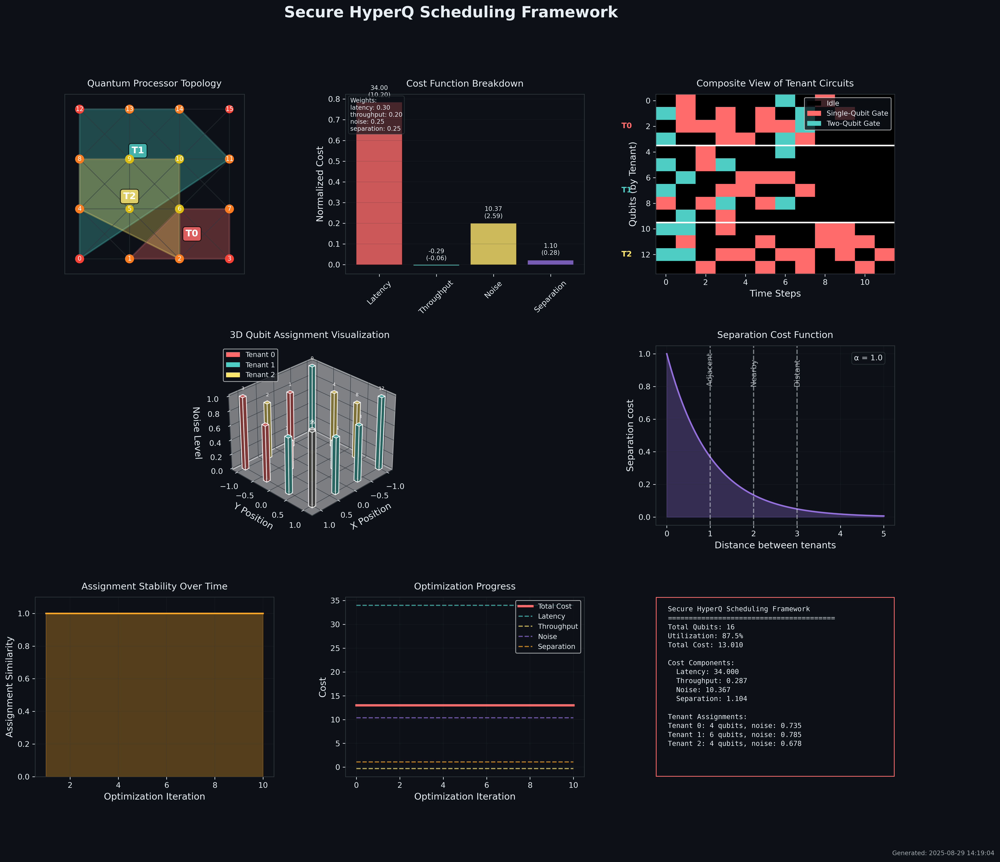

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors, patches, animation
from mpl_toolkits.mplot3d import Axes3D, art3d
from matplotlib.collections import PolyCollection
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import matplotlib.gridspec as gridspec
from matplotlib.patches import FancyBboxPatch, Rectangle, ConnectionPatch
from matplotlib.text import TextPath
from matplotlib.transforms import Affine2D
import matplotlib.patheffects as path_effects
from scipy.spatial import distance
from scipy.optimize import minimize
from scipy.interpolate import interp1d
import networkx as nx
from matplotlib.colors import to_rgba, to_rgb
import matplotlib.cm as cm
from matplotlib import ticker
from matplotlib.legend_handler import HandlerPatch
import matplotlib.font_manager as fm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import math
from functools import partial
import time
from datetime import datetime
import os
import json
from cycler import cycler


np.random.seed(42)


QUANTUM_COLORS = {
    'background': '#0D1117',
    'grid': '#2F363D',
    'text': '#E6EDF3',
    'accent1': '#FF6B6B',
    'accent2': '#4ECDC4',
    'accent3': '#FFE66D',
    'accent4': '#9370DB',
    'accent5': '#FFA726',
    'accent6': '#AB47BC',
    'good': '#4CAF50',
    'bad': '#F44336',
    'warning': '#FFC107',
    'tenant1': '#FF6B6B',
    'tenant2': '#4ECDC4',
    'tenant3': '#FFE66D',
    'tenant4': '#9370DB',
    'tenant5': '#FFA726',
    'noise_low': '#4CAF50',
    'noise_medium': '#FFC107',
    'noise_high': '#F44336'
}


noise_cmap = LinearSegmentedColormap.from_list('noise_cmap', 
                                              [QUANTUM_COLORS['noise_low'], 
                                               QUANTUM_COLORS['noise_medium'], 
                                               QUANTUM_COLORS['noise_high']])


tenant_cmap = ListedColormap([QUANTUM_COLORS['tenant1'], 
                              QUANTUM_COLORS['tenant2'], 
                              QUANTUM_COLORS['tenant3'],
                              QUANTUM_COLORS['tenant4'],
                              QUANTUM_COLORS['tenant5']])


plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['DejaVu Sans', 'Arial'],
    'font.size': 10,
    'axes.facecolor': QUANTUM_COLORS['background'],
    'axes.edgecolor': QUANTUM_COLORS['grid'],
    'axes.labelcolor': QUANTUM_COLORS['text'],
    'axes.titlecolor': QUANTUM_COLORS['text'],
    'figure.facecolor': QUANTUM_COLORS['background'],
    'figure.edgecolor': QUANTUM_COLORS['background'],
    'text.color': QUANTUM_COLORS['text'],
    'xtick.color': QUANTUM_COLORS['text'],
    'ytick.color': QUANTUM_COLORS['text'],
    'grid.color': QUANTUM_COLORS['grid'],
    'grid.linewidth': 0.5,
    'grid.alpha': 0.3,
})

class QuantumProcessor:

    
    def __init__(self, num_qubits=16, topology='grid', noise_profile='random'):
        self.num_qubits = num_qubits
        self.topology = topology
        self.noise_profile = noise_profile
        
y
        self.generate_qubit_positions()
        

        self.generate_connectivity_graph()
        

        self.generate_noise_map()
        
    def generate_qubit_positions(self):

        if self.topology == 'grid':

            grid_size = int(np.ceil(np.sqrt(self.num_qubits)))
            self.positions = np.zeros((self.num_qubits, 2))
            
            for i in range(self.num_qubits):
                row = i // grid_size
                col = i % grid_size
                self.positions[i] = [col, row]
                
        elif self.topology == 'circle':

            angles = np.linspace(0, 2*np.pi, self.num_qubits, endpoint=False)
            self.positions = np.array([np.cos(angles), np.sin(angles)]).T
            
        elif self.topology == 'heavy_hex':

            rows = int(np.ceil(np.sqrt(self.num_qubits)))
            self.positions = np.zeros((self.num_qubits, 2))
            
            idx = 0
            for row in range(rows):
                for col in range(rows):
                    if idx < self.num_qubits:
                        x = col + 0.5 * (row % 2)
                        y = row * 0.866  
                        self.positions[idx] = [x, y]
                        idx += 1
        

        self.positions = (self.positions - np.min(self.positions, axis=0)) / (
            np.max(self.positions, axis=0) - np.min(self.positions, axis=0)) * 2 - 1
        
    def generate_connectivity_graph(self):

        self.graph = nx.Graph()
        

        for i in range(self.num_qubits):
            self.graph.add_node(i, pos=self.positions[i])
            

        dist_matrix = distance.cdist(self.positions, self.positions)
        
        if self.topology == 'grid':

            for i in range(self.num_qubits):
                for j in range(i+1, self.num_qubits):
                    if dist_matrix[i, j] < 1.2:  
                        self.graph.add_edge(i, j, weight=1/dist_matrix[i, j])
                        
        elif self.topology == 'circle':
 
            for i in range(self.num_qubits):
                self.graph.add_edge(i, (i+1) % self.num_qubits, weight=1.0)
                
        elif self.topology == 'heavy_hex':

            for i in range(self.num_qubits):
                for j in range(i+1, self.num_qubits):
                    if dist_matrix[i, j] < 1.2:
                        self.graph.add_edge(i, j, weight=1/dist_matrix[i, j])
    
    def generate_noise_map(self):

        if self.noise_profile == 'random':
            self.noise_map = np.random.uniform(0.1, 1.0, self.num_qubits)
        elif self.noise_profile == 'center':

            center = np.mean(self.positions, axis=0)
            dist_to_center = np.linalg.norm(self.positions - center, axis=1)
            self.noise_map = 0.1 + 0.9 * (dist_to_center / np.max(dist_to_center))
        elif self.noise_profile == 'edge':

            center = np.mean(self.positions, axis=0)
            dist_to_center = np.linalg.norm(self.positions - center, axis=1)
            self.noise_map = 1.0 - 0.9 * (dist_to_center / np.max(dist_to_center))
    
    def draw(self, ax, highlight_qubits=None):


        for edge in self.graph.edges:
            i, j = edge
            pos_i = self.positions[i]
            pos_j = self.positions[j]
            ax.plot([pos_i[0], pos_j[0]], [pos_i[1], pos_j[1]], 
                   color=QUANTUM_COLORS['grid'], alpha=0.5, linewidth=1)
        

        for i, pos in enumerate(self.positions):
            color = noise_cmap(self.noise_map[i])
            edgecolor = 'white' if highlight_qubits and i in highlight_qubits else 'black'
            linewidth = 2 if highlight_qubits and i in highlight_qubits else 1
            
            circle = plt.Circle(pos, 0.05, color=color, edgecolor=edgecolor, 
                               linewidth=linewidth, zorder=10)
            ax.add_patch(circle)
            

            ax.text(pos[0], pos[1], str(i), color='white', 
                   fontsize=8, ha='center', va='center', zorder=11)
        
        ax.set_aspect('equal')
        ax.set_xlim(-1.2, 1.2)
        ax.set_ylim(-1.2, 1.2)
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title('Quantum Processor Topology', color=QUANTUM_COLORS['text'], pad=10)

class Tenant:

    
    def __init__(self, id, num_qubits, circuit_depth, two_qubit_gate_count, priority=1):
        self.id = id
        self.num_qubits = num_qubits
        self.circuit_depth = circuit_depth
        self.two_qubit_gate_count = two_qubit_gate_count
        self.priority = priority
        self.color = QUANTUM_COLORS[f'tenant{id+1}']
        

        self.generate_circuit()
        
    def generate_circuit(self):


        self.circuit = np.zeros((self.circuit_depth, self.num_qubits))
        

        for i in range(self.circuit_depth):
            for j in range(self.num_qubits):
                if np.random.random() < 0.3:  
                    self.circuit[i, j] = 1 
        

        gates_added = 0
        while gates_added < self.two_qubit_gate_count:
            time_step = np.random.randint(0, self.circuit_depth)
            qubit1 = np.random.randint(0, self.num_qubits)
            qubit2 = (qubit1 + np.random.randint(1, self.num_qubits)) % self.num_qubits
            

            self.circuit[time_step, qubit1] = 2
            self.circuit[time_step, qubit2] = 2
            gates_added += 1
    
    def draw_circuit(self, ax):

        cmap = ListedColormap(['black', QUANTUM_COLORS['accent1'], QUANTUM_COLORS['accent2']])
        
        ax.imshow(self.circuit.T, cmap=cmap, aspect='auto', interpolation='nearest')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Qubits')
        ax.set_title(f'Tenant {self.id} Circuit', color=self.color, pad=10)
        

        legend_elements = [
            patches.Patch(facecolor='black', label='Idle'),
            patches.Patch(facecolor=QUANTUM_COLORS['accent1'], label='Single-Qubit Gate'),
            patches.Patch(facecolor=QUANTUM_COLORS['accent2'], label='Two-Qubit Gate')
        ]
        ax.legend(handles=legend_elements, loc='upper right', facecolor=QUANTUM_COLORS['background'])

class SecureScheduler:

    
    def __init__(self, processor, tenants, weights=None):
        self.processor = processor
        self.tenants = tenants
        self.num_tenants = len(tenants)
        

        self.weights = weights or {
            'latency': 0.3,
            'throughput': 0.2,
            'noise': 0.25,
            'separation': 0.25
        }
        

        self.assignments = {}
        self.assignment_history = []
        

        self.alpha = 1.0  
        self.beta = 0.5   
        
    def find_initial_assignment(self):


        available_qubits = list(range(self.processor.num_qubits))
        np.random.shuffle(available_qubits)
        
        assignment = {}
        start_idx = 0
        
        for tenant in self.tenants:
            end_idx = start_idx + tenant.num_qubits
            if end_idx > len(available_qubits):
                raise ValueError("Not enough qubits for all tenants")
                
            assignment[tenant.id] = available_qubits[start_idx:end_idx]
            start_idx = end_idx
            
        self.assignments = assignment
        self.assignment_history.append(assignment.copy())
        return assignment
    
    def calculate_cost(self, assignment):

        cost = 0
        

        latency_cost = self.calculate_latency_cost(assignment)
        cost += self.weights['latency'] * latency_cost
        

        throughput_cost = self.calculate_throughput_cost(assignment)
        cost += self.weights['throughput'] * throughput_cost
        

        noise_cost = self.calculate_noise_cost(assignment)
        cost += self.weights['noise'] * noise_cost
        

        separation_cost = self.calculate_separation_cost(assignment)
        cost += self.weights['separation'] * separation_cost
        
        return cost, {
            'latency': latency_cost,
            'throughput': throughput_cost,
            'noise': noise_cost,
            'separation': separation_cost
        }
    
    def calculate_latency_cost(self, assignment):

        total_latency = 0
        
        for tenant in self.tenants:
            qubits = assignment[tenant.id]
            

            swap_cost = 0
            for i in range(len(qubits)-1):
                if not self.processor.graph.has_edge(qubits[i], qubits[i+1]):
                    swap_cost += self.beta
            
            total_latency += tenant.circuit_depth + swap_cost
            
        return total_latency
    
    def calculate_throughput_cost(self, assignment):


        total_throughput = 0
        
        for tenant in self.tenants:
            qubits = assignment[tenant.id]
            

            exec_time = tenant.circuit_depth * (1 + 0.1 * np.mean(self.processor.noise_map[qubits]))
            total_throughput += 1 / exec_time
            
        return -total_throughput  
    
    def calculate_noise_cost(self, assignment):

        total_noise = 0
        
        for tenant in self.tenants:
            qubits = assignment[tenant.id]
            total_noise += np.sum(self.processor.noise_map[qubits])
            
        return total_noise
    
    def calculate_separation_cost(self, assignment):

        total_separation = 0
        

        tenant_ids = list(assignment.keys())
        
        for i in range(len(tenant_ids)):
            for j in range(i+1, len(tenant_ids)):
                tenant1 = tenant_ids[i]
                tenant2 = tenant_ids[j]
                
                qubits1 = assignment[tenant1]
                qubits2 = assignment[tenant2]

                min_distance = float('inf')
                for q1 in qubits1:
                    for q2 in qubits2:

                        try:
                            dist = nx.shortest_path_length(self.processor.graph, q1, q2)
                            if dist < min_distance:
                                min_distance = dist
                        except nx.NetworkXNoPath:

                            dist = 10
                            if dist < min_distance:
                                min_distance = dist
                

                total_separation += np.exp(-self.alpha * min_distance)
                
        return total_separation
    
    def optimize_assignment(self, max_iter=100):

        current_assignment = self.assignments.copy()
        current_cost, cost_components = self.calculate_cost(current_assignment)
        
        best_assignment = current_assignment.copy()
        best_cost = current_cost
        best_components = cost_components
        

        for iteration in range(max_iter):
s
            new_assignment = current_assignment.copy()
            

            tenant_ids = list(new_assignment.keys())
            tenant1, tenant2 = np.random.choice(tenant_ids, 2, replace=False)
            

            if (len(new_assignment[tenant1]) > 0 and 
                len(new_assignment[tenant2]) > 0):
                idx1 = np.random.randint(0, len(new_assignment[tenant1]))
                idx2 = np.random.randint(0, len(new_assignment[tenant2]))
                

                qubit1 = new_assignment[tenant1][idx1]
                qubit2 = new_assignment[tenant2][idx2]
                
                new_assignment[tenant1][idx1] = qubit2
                new_assignment[tenant2][idx2] = qubit1
                

                new_cost, new_components = self.calculate_cost(new_assignment)
                

                if (new_cost < current_cost or 
                    np.random.random() < np.exp(-(new_cost - current_cost) / (max(1, max_iter - iteration)))):
                    current_assignment = new_assignment.copy()
                    current_cost = new_cost
                    cost_components = new_components
                    
                    if new_cost < best_cost:
                        best_assignment = new_assignment.copy()
                        best_cost = new_cost
                        best_components = new_components
        
        self.assignments = best_assignment
        self.assignment_history.append(best_assignment.copy())
        
        return best_assignment, best_cost, best_components
    
    def draw_assignment(self, ax, assignment=None):

        if assignment is None:
            assignment = self.assignments
            

        all_assigned_qubits = [q for tenant_qubits in assignment.values() for q in tenant_qubits]
        self.processor.draw(ax, highlight_qubits=all_assigned_qubits)
        

        for tenant_id, qubits in assignment.items():
            color = self.tenants[tenant_id].color
            

            if len(qubits) > 2:
                points = self.processor.positions[qubits]
                hull = self.convex_hull(points)
                poly = patches.Polygon(hull, alpha=0.3, color=color, linewidth=2)
                ax.add_patch(poly)

            centroid = np.mean(self.processor.positions[qubits], axis=0)
            ax.text(centroid[0], centroid[1], f'T{tenant_id}', color='white',
                   fontsize=12, fontweight='bold', ha='center', va='center',
                   bbox=dict(boxstyle='round,pad=0.3', facecolor=color, alpha=0.8))
    
    def convex_hull(self, points):

        from scipy.spatial import ConvexHull
        hull = ConvexHull(points)
        return points[hull.vertices]

class Visualization:

    
    def __init__(self, processor, tenants, scheduler):
        self.processor = processor
        self.tenants = tenants
        self.scheduler = scheduler
        self.fig = None
        
    def create_comprehensive_visualization(self):

        self.fig = plt.figure(figsize=(20, 16), facecolor=QUANTUM_COLORS['background'])
        

        gs = gridspec.GridSpec(3, 3, figure=self.fig, 
                              height_ratios=[1, 1, 1],
                              width_ratios=[1, 1, 1],
                              hspace=0.4, wspace=0.3)
        

        ax_processor = self.fig.add_subplot(gs[0, 0])
        self.scheduler.draw_assignment(ax_processor)
        

        ax_cost = self.fig.add_subplot(gs[0, 1])
        self.plot_cost_breakdown(ax_cost)
        

        ax_circuits = self.fig.add_subplot(gs[0, 2])
        self.plot_tenant_circuits(ax_circuits)
        

        ax_3d = self.fig.add_subplot(gs[1, 0:2], projection='3d')
        self.plot_3d_assignment(ax_3d)
        

        ax_separation = self.fig.add_subplot(gs[1, 2])
        self.plot_separation_cost(ax_separation)
        

        ax_timeline = self.fig.add_subplot(gs[2, 0])
        self.plot_assignment_timeline(ax_timeline)
        

        ax_optimization = self.fig.add_subplot(gs[2, 1])
        self.plot_optimization_progress(ax_optimization)
        

        ax_info = self.fig.add_subplot(gs[2, 2])
        self.plot_info_panel(ax_info)
        

        self.fig.suptitle('Secure HyperQ Scheduling Framework', 
                         fontsize=20, color=QUANTUM_COLORS['text'], 
                         fontweight='bold', y=0.98)
        

        timestamp = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        self.fig.text(0.99, 0.02, f"Generated: {timestamp}", 
                     ha='right', va='bottom', fontsize=8, 
                     color=QUANTUM_COLORS['text'], alpha=0.7)
        
        return self.fig
    
    def plot_cost_breakdown(self, ax):


        _, cost_components = self.scheduler.calculate_cost(self.scheduler.assignments)
        
        components = list(cost_components.keys())
        values = list(cost_components.values())
        weights = list(self.scheduler.weights.values())
        weighted_values = [v * w for v, w in zip(values, weights)]
        

        total = sum(weighted_values)
        normalized_values = [v / total for v in weighted_values] if total > 0 else weighted_values
        

        x = np.arange(len(components))
        bars = ax.bar(x, normalized_values, color=[
            QUANTUM_COLORS['accent1'],
            QUANTUM_COLORS['accent2'],
            QUANTUM_COLORS['accent3'],
            QUANTUM_COLORS['accent4']
        ], alpha=0.8)
        

        for i, (v, wv) in enumerate(zip(values, weighted_values)):
            ax.text(i, normalized_values[i] + 0.02, f'{v:.2f}\n({wv:.2f})', 
                   ha='center', va='bottom', fontsize=8, color=QUANTUM_COLORS['text'])
        
        ax.set_xticks(x)
        ax.set_xticklabels([c.capitalize() for c in components], rotation=45)
        ax.set_ylabel('Normalized Cost')
        ax.set_title('Cost Function Breakdown', color=QUANTUM_COLORS['text'], pad=10)
        ax.grid(True, alpha=0.3, axis='y')
        

        weight_text = '\n'.join([f'{c}: {w:.2f}' for c, w in zip(components, weights)])
        ax.text(0.02, 0.98, f'Weights:\n{weight_text}', transform=ax.transAxes,
               va='top', ha='left', fontsize=8, 
               bbox=dict(boxstyle='round', facecolor=QUANTUM_COLORS['background'], 
                        edgecolor=QUANTUM_COLORS['grid'], alpha=0.7))
    
    def plot_tenant_circuits(self, ax):


        max_depth = max(tenant.circuit_depth for tenant in self.tenants)
        total_qubits = sum(tenant.num_qubits for tenant in self.tenants)
        
        composite_circuit = np.zeros((max_depth, total_qubits))
        
        qubit_offset = 0
        for tenant in self.tenants:
            composite_circuit[:tenant.circuit_depth, qubit_offset:qubit_offset+tenant.num_qubits] = tenant.circuit
            qubit_offset += tenant.num_qubits
        

        cmap = ListedColormap(['black', QUANTUM_COLORS['accent1'], QUANTUM_COLORS['accent2']])
        

        im = ax.imshow(composite_circuit.T, cmap=cmap, aspect='auto', interpolation='nearest')
        

        qubit_offset = 0
        for i, tenant in enumerate(self.tenants):
            if i > 0:
                ax.axhline(qubit_offset - 0.5, color='white', linestyle='-', linewidth=2)
            qubit_offset += tenant.num_qubits
        
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Qubits (by Tenant)')
        ax.set_title('Composite View of Tenant Circuits', color=QUANTUM_COLORS['text'], pad=10)
        

        qubit_offset = 0
        for tenant in self.tenants:
            mid_point = qubit_offset + tenant.num_qubits / 2
            ax.text(-0.1, mid_point, f'T{tenant.id}', transform=ax.get_yaxis_transform(),
                   ha='right', va='center', color=tenant.color, fontweight='bold')
            qubit_offset += tenant.num_qubits
        

        legend_elements = [
            patches.Patch(facecolor='black', label='Idle'),
            patches.Patch(facecolor=QUANTUM_COLORS['accent1'], label='Single-Qubit Gate'),
            patches.Patch(facecolor=QUANTUM_COLORS['accent2'], label='Two-Qubit Gate')
        ]
        ax.legend(handles=legend_elements, loc='upper right', 
                 facecolor=QUANTUM_COLORS['background'])
    
    def plot_3d_assignment(self, ax):


        x_pos = self.processor.positions[:, 0]
        y_pos = self.processor.positions[:, 1]
        

        qubit_assignments = np.zeros(self.processor.num_qubits) - 1
        for tenant_id, qubits in self.scheduler.assignments.items():
            for qubit in qubits:
                qubit_assignments[qubit] = tenant_id
        

        colors = [self.tenants[int(a)].color if a >= 0 else 'gray' 
                 for a in qubit_assignments]
        

        dx = dy = 0.1
        dz = self.processor.noise_map
        
        for i, (x, y, z, color) in enumerate(zip(x_pos, y_pos, dz, colors)):
            ax.bar3d(x, y, 0, dx, dy, z, color=color, alpha=0.8, edgecolor='white')
            

            ax.text(x, y, z + 0.05, str(i), color='white', 
                   fontsize=6, ha='center', va='bottom')
        
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_zlabel('Noise Level')
        ax.set_title('3D Qubit Assignment Visualization', color=QUANTUM_COLORS['text'], pad=10)
        

        ax.view_init(elev=30, azim=45)
        

        legend_elements = []
        for tenant in self.tenants:
            legend_elements.append(patches.Patch(facecolor=tenant.color, 
                                                label=f'Tenant {tenant.id}'))
        ax.legend(handles=legend_elements, loc='upper left', 
                 facecolor=QUANTUM_COLORS['background'])
    
    def plot_separation_cost(self, ax):

        distances = np.linspace(0, 5, 100)
        costs = np.exp(-self.scheduler.alpha * distances)
        
        ax.plot(distances, costs, color=QUANTUM_COLORS['accent4'], linewidth=2)
        ax.fill_between(distances, 0, costs, color=QUANTUM_COLORS['accent4'], alpha=0.3)
        
        ax.set_xlabel('Distance between tenants')
        ax.set_ylabel('Separation cost')
        ax.set_title('Separation Cost Function', color=QUANTUM_COLORS['text'], pad=10)
        ax.grid(True, alpha=0.3)
        

        ax.text(0.95, 0.95, f'α = {self.scheduler.alpha}', transform=ax.transAxes,
               ha='right', va='top', fontsize=10,
               bbox=dict(boxstyle='round', facecolor=QUANTUM_COLORS['background'], 
                        edgecolor=QUANTUM_COLORS['grid'], alpha=0.7))
        

        ax.axvline(1, color=QUANTUM_COLORS['text'], linestyle='--', alpha=0.5)
        ax.axvline(2, color=QUANTUM_COLORS['text'], linestyle='--', alpha=0.5)
        ax.axvline(3, color=QUANTUM_COLORS['text'], linestyle='--', alpha=0.5)
        
        ax.text(1, 0.8, 'Adjacent', ha='center', va='bottom', rotation=90, alpha=0.7)
        ax.text(2, 0.8, 'Nearby', ha='center', va='bottom', rotation=90, alpha=0.7)
        ax.text(3, 0.8, 'Distant', ha='center', va='bottom', rotation=90, alpha=0.7)
    
    def plot_assignment_timeline(self, ax):

        if len(self.scheduler.assignment_history) < 2:
            ax.text(0.5, 0.5, 'Not enough history to show timeline', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title('Assignment Timeline', color=QUANTUM_COLORS['text'], pad=10)
            return
        
  
        similarities = []
        for i in range(1, len(self.scheduler.assignment_history)):
            prev = self.scheduler.assignment_history[i-1]
            curr = self.scheduler.assignment_history[i]
            

            tenant_similarities = []
            for tenant in self.tenants:
                prev_set = set(prev[tenant.id])
                curr_set = set(curr[tenant.id])
                if len(prev_set | curr_set) > 0:
                    similarity = len(prev_set & curr_set) / len(prev_set | curr_set)
                else:
                    similarity = 1.0
                tenant_similarities.append(similarity)
            
            similarities.append(np.mean(tenant_similarities))
        

        iterations = range(1, len(similarities) + 1)
        ax.plot(iterations, similarities, color=QUANTUM_COLORS['accent5'], linewidth=2)
        ax.fill_between(iterations, similarities, 0, color=QUANTUM_COLORS['accent5'], alpha=0.3)
        
        ax.set_xlabel('Optimization Iteration')
        ax.set_ylabel('Assignment Similarity')
        ax.set_title('Assignment Stability Over Time', color=QUANTUM_COLORS['text'], pad=10)
        ax.grid(True, alpha=0.3)
        ax.set_ylim(0, 1.1)
    
    def plot_optimization_progress(self, ax):

        if len(self.scheduler.assignment_history) < 2:
            ax.text(0.5, 0.5, 'Not enough history to show optimization', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title('Optimization Progress', color=QUANTUM_COLORS['text'], pad=10)
            return
        

        costs = []
        cost_components_history = []
        
        for assignment in self.scheduler.assignment_history:
            cost, components = self.scheduler.calculate_cost(assignment)
            costs.append(cost)
            cost_components_history.append(components)
        

        iterations = range(len(costs))
        ax.plot(iterations, costs, color=QUANTUM_COLORS['accent1'], linewidth=3, label='Total Cost')

        components = list(cost_components_history[0].keys())
        colors = [QUANTUM_COLORS['accent2'], QUANTUM_COLORS['accent3'], 
                 QUANTUM_COLORS['accent4'], QUANTUM_COLORS['accent5']]
        
        for i, component in enumerate(components):
            comp_costs = [comp[component] for comp in cost_components_history]
            ax.plot(iterations, comp_costs, color=colors[i], linewidth=1.5, 
                   linestyle='--', alpha=0.7, label=component.capitalize())
        
        ax.set_xlabel('Optimization Iteration')
        ax.set_ylabel('Cost')
        ax.set_title('Optimization Progress', color=QUANTUM_COLORS['text'], pad=10)
        ax.grid(True, alpha=0.3)
        ax.legend(facecolor=QUANTUM_COLORS['background'])
    
    def plot_info_panel(self, ax):

        ax.axis('off')
        

        total_cost, cost_components = self.scheduler.calculate_cost(self.scheduler.assignments)
        total_qubits = self.processor.num_qubits
        used_qubits = sum(len(qubits) for qubits in self.scheduler.assignments.values())
        utilization = used_qubits / total_qubits * 100
        

        tenant_info = []
        for tenant in self.tenants:
            qubits = self.scheduler.assignments[tenant.id]
            avg_noise = np.mean(self.processor.noise_map[qubits])
            tenant_info.append(f"Tenant {tenant.id}: {tenant.num_qubits} qubits, "
                              f"noise: {avg_noise:.3f}")
        

        info_text = [
            "Secure HyperQ Scheduling Framework",
            "=" * 40,
            f"Total Qubits: {total_qubits}",
            f"Utilization: {utilization:.1f}%",
            f"Total Cost: {total_cost:.3f}",
            "",
            "Cost Components:",
            f"  Latency: {cost_components['latency']:.3f}",
            f"  Throughput: {-cost_components['throughput']:.3f}",
            f"  Noise: {cost_components['noise']:.3f}",
            f"  Separation: {cost_components['separation']:.3f}",
            "",
            "Tenant Assignments:"
        ]
        
        info_text.extend(tenant_info)
        

        for i, line in enumerate(info_text):
            y_pos = 0.95 - i * 0.05
            ax.text(0.05, y_pos, line, transform=ax.transAxes, 
                   fontfamily='monospace', fontsize=9, 
                   color=QUANTUM_COLORS['text'], va='top')
        

        border = patches.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                                  fill=False, edgecolor=QUANTUM_COLORS['accent1'],
                                  linewidth=2)
        ax.add_patch(border)


def create_complex_visualization():


    processor = QuantumProcessor(num_qubits=16, topology='grid', noise_profile='center')
    

    tenants = [
        Tenant(0, num_qubits=4, circuit_depth=10, two_qubit_gate_count=3, priority=1),
        Tenant(1, num_qubits=6, circuit_depth=8, two_qubit_gate_count=4, priority=2),
        Tenant(2, num_qubits=4, circuit_depth=12, two_qubit_gate_count=2, priority=1)
    ]
    

    scheduler = SecureScheduler(processor, tenants)
    

    scheduler.find_initial_assignment()
    

    for _ in range(10):
        scheduler.optimize_assignment(max_iter=20)
    

    viz = Visualization(processor, tenants, scheduler)
    fig = viz.create_comprehensive_visualization()
    
    return fig


fig = create_complex_visualization()



plt.show()

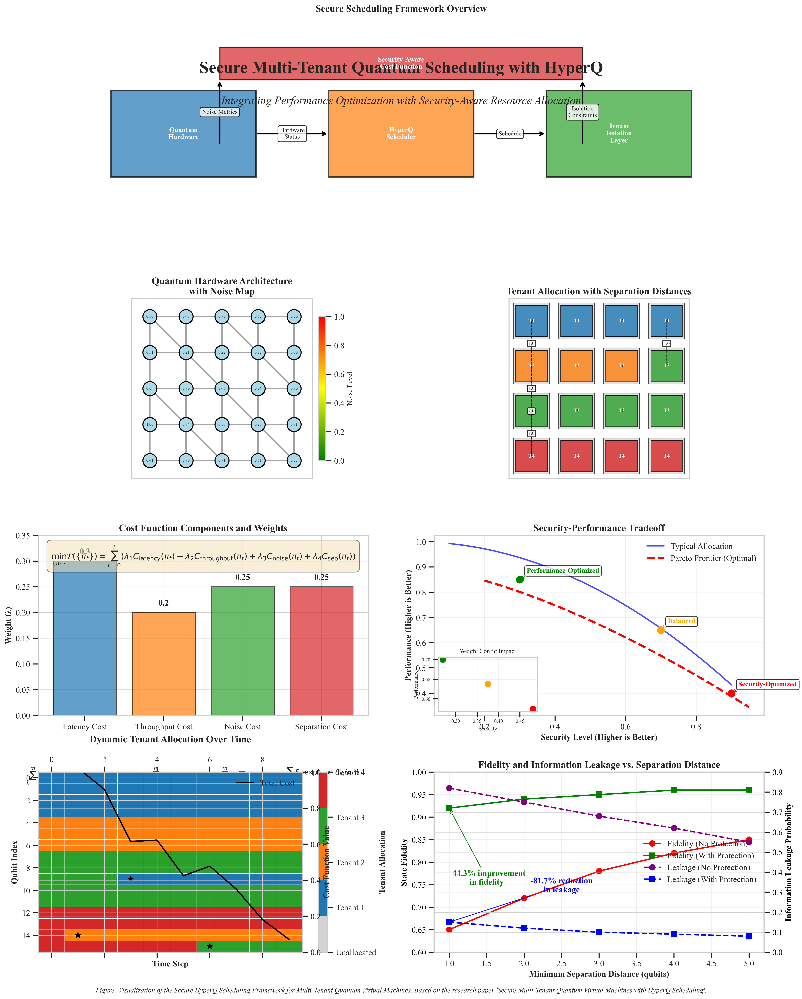

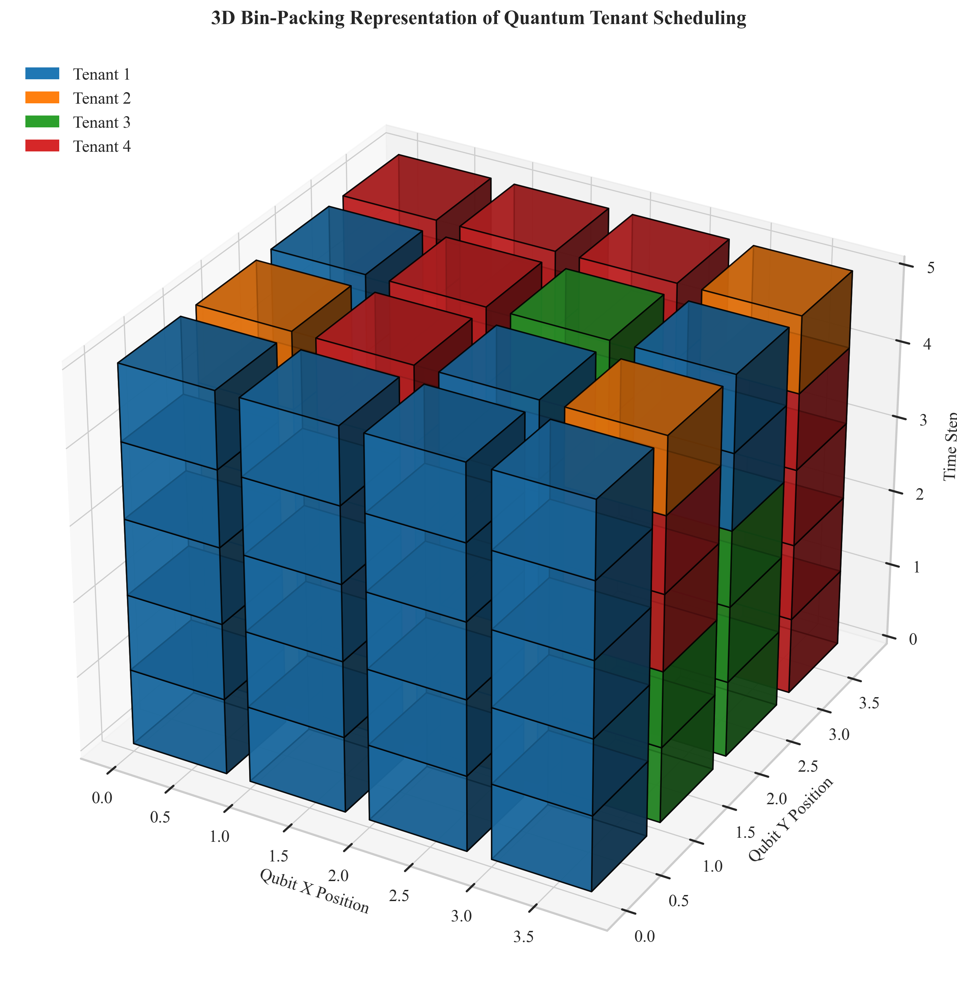

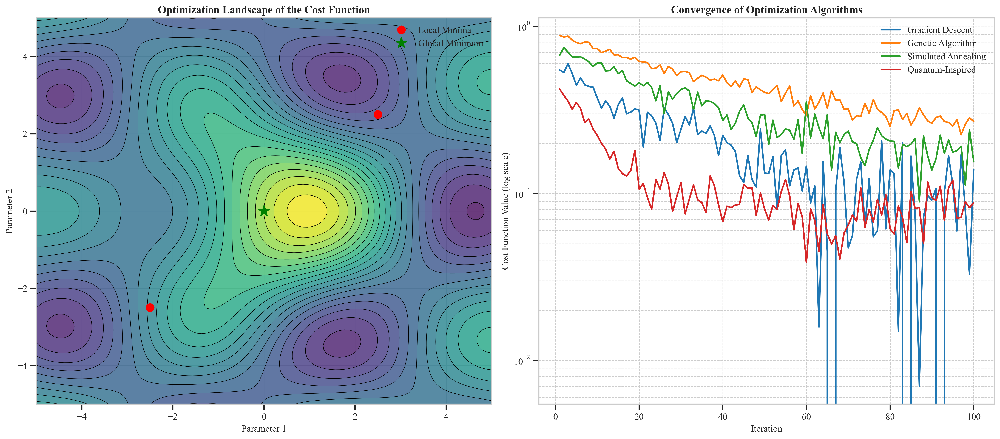

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle, Polygon, FancyBboxPatch
from matplotlib.collections import PatchCollection
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
from matplotlib import cm
import matplotlib.gridspec as gridspec
from matplotlib import colors
import matplotlib.patheffects as path_effects
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib import ticker
import matplotlib as mpl
from scipy.optimize import minimize
from scipy.spatial import distance
from scipy import stats
import networkx as nx
from matplotlib.patches import ConnectionPatch
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from matplotlib.colors import LightSource
import math
from matplotlib import transforms


plt.style.use('seaborn-v0_8-whitegrid')
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = ['Times New Roman']
mpl.rcParams['font.size'] = 12
mpl.rcParams['axes.linewidth'] = 1.5
mpl.rcParams['xtick.major.width'] = 1.5
mpl.rcParams['ytick.major.width'] = 1.5
mpl.rcParams['xtick.major.size'] = 8
mpl.rcParams['ytick.major.size'] = 8
mpl.rcParams['figure.figsize'] = [14, 10]
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams['savefig.dpi'] = 300


fig = plt.figure(constrained_layout=False, figsize=(16, 20))


gs = gridspec.GridSpec(4, 2, figure=fig, height_ratios=[1.2, 1, 1, 1], width_ratios=[1, 1])


ax1 = fig.add_subplot(gs[0, :]) 
ax2 = fig.add_subplot(gs[1, 0])  
ax3 = fig.add_subplot(gs[1, 1])  
ax4 = fig.add_subplot(gs[2, 0])  
ax5 = fig.add_subplot(gs[2, 1]) 
ax6 = fig.add_subplot(gs[3, 0]) 
ax7 = fig.add_subplot(gs[3, 1])  


ax1.axis('off')


title_text = ax1.text(0.5, 0.8, "Secure Multi-Tenant Quantum Scheduling with HyperQ",
                     ha='center', va='center', fontsize=24, fontweight='bold',
                     transform=ax1.transAxes)
subtitle_text = ax1.text(0.5, 0.65, "Integrating Performance Optimization with Security-Aware Resource Allocation",
                         ha='center', va='center', fontsize=16, style='italic',
                         transform=ax1.transAxes)


def draw_schematic_overview(ax):

    components = [
        {"type": "rectangle", "xy": (0.1, 0.3), "width": 0.2, "height": 0.4, "label": "Quantum\nHardware", "color": "#1f77b4"},
        {"type": "rectangle", "xy": (0.4, 0.3), "width": 0.2, "height": 0.4, "label": "HyperQ\nScheduler", "color": "#ff7f0e"},
        {"type": "rectangle", "xy": (0.7, 0.3), "width": 0.2, "height": 0.4, "label": "Tenant\nIsolation\nLayer", "color": "#2ca02c"},
        {"type": "rectangle", "xy": (0.25, 0.75), "width": 0.5, "height": 0.15, "label": "Security-Aware\nCost Function", "color": "#d62728"}
    ]
    

    for comp in components:
        if comp["type"] == "rectangle":
            rect = Rectangle(comp["xy"], comp["width"], comp["height"],
                            linewidth=2, edgecolor='black',
                            facecolor=comp["color"], alpha=0.7)
            ax.add_patch(rect)
            

            ax.text(comp["xy"][0] + comp["width"]/2, comp["xy"][1] + comp["height"]/2,
                   comp["label"], ha='center', va='center', fontweight='bold',
                   fontsize=10, color='white')
    

    arrows = [
        ((0.3, 0.5), (0.4, 0.5), "Hardware\nStatus"),
        ((0.6, 0.5), (0.7, 0.5), "Schedule"),
        ((0.25, 0.45), (0.25, 0.75), "Noise Metrics"),
        ((0.75, 0.45), (0.75, 0.75), "Isolation\nConstraints")
    ]
    
    for start, end, label in arrows:
        ax.annotate('', xy=end, xytext=start,
                   arrowprops=dict(arrowstyle='->', lw=2, color='black'))
        ax.text((start[0]+end[0])/2, (start[1]+end[1])/2, label,
               ha='center', va='center', fontsize=9,
               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))
    
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title("Secure Scheduling Framework Overview", fontsize=14, fontweight='bold', pad=20)

draw_schematic_overview(ax1)


def draw_quantum_hardware(ax):

    n_rows, n_cols = 5, 5
    qubit_positions = {}
    

    for i in range(n_rows):
        for j in range(n_cols):
            qubit_positions[i*n_cols + j] = (j, n_rows - 1 - i)
    

    G = nx.Graph()
    

    for qubit_id, pos in qubit_positions.items():
        G.add_node(qubit_id, pos=pos)
    

    for i in range(n_rows):
        for j in range(n_cols):
            qubit_id = i * n_cols + j

            if j < n_cols - 1:
                G.add_edge(qubit_id, qubit_id + 1)

            if i < n_rows - 1:
                G.add_edge(qubit_id, qubit_id + n_cols)

            if j < n_cols - 1 and i < n_rows - 1 and (i + j) % 2 == 0:
                G.add_edge(qubit_id, qubit_id + n_cols + 1)
    

    pos = nx.get_node_attributes(G, 'pos')
    nx.draw_networkx_nodes(G, pos, ax=ax, node_size=400,
                          node_color='lightblue', edgecolors='black', linewidths=1.5)
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color='gray', width=2, alpha=0.7)
    

    noise_levels = np.random.rand(len(G.nodes())) * 0.8 + 0.2 
    

    cmap = LinearSegmentedColormap.from_list('noise_cmap', ['green', 'yellow', 'red'])
    
    for node, (x, y) in pos.items():
        circle = plt.Circle((x, y), 0.15, color=cmap(noise_levels[node]), alpha=0.7)
        ax.add_patch(circle)
        ax.text(x, y, f"{noise_levels[node]:.2f}", ha='center', va='center', fontsize=6)
    

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=0, vmax=1))
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, shrink=0.8, pad=0.02)
    cbar.set_label('Noise Level', fontsize=10)
    
    ax.set_title("Quantum Hardware Architecture\nwith Noise Map", fontsize=14, fontweight='bold')
    ax.set_xlim(-0.5, n_cols - 0.5)
    ax.set_ylim(-0.5, n_rows - 0.5)
    ax.set_aspect('equal')
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

draw_quantum_hardware(ax2)


def draw_tenant_allocation(ax):

    n_qubits = 16
    grid_size = int(np.sqrt(n_qubits))

    tenants = [
        {"id": 1, "qubits": 4, "color": "#1f77b4", "priority": 0.9},
        {"id": 2, "qubits": 3, "color": "#ff7f0e", "priority": 0.7},
        {"id": 3, "qubits": 5, "color": "#2ca02c", "priority": 0.8},
        {"id": 4, "qubits": 4, "color": "#d62728", "priority": 0.6}
    ]
    

    positions = []
    for i in range(grid_size):
        for j in range(grid_size):
            positions.append((j, grid_size - 1 - i))
    

    allocations = {}
    start_idx = 0
    for tenant in tenants:
        n = tenant["qubits"]

        row = start_idx // grid_size
        col = start_idx % grid_size
        allocations[tenant["id"]] = []
    
        for i in range(n):
            if col >= grid_size:
                col = 0
                row += 1
            allocations[tenant["id"]].append(row * grid_size + col)
            col += 1
    
        start_idx += n
    

    for i in range(n_qubits):
        x, y = positions[i]
        rect = Rectangle((x - 0.4, y - 0.4), 0.8, 0.8,
                        facecolor='lightgray', edgecolor='black', alpha=0.7)
        ax.add_patch(rect)
        ax.text(x, y, str(i), ha='center', va='center', fontsize=8)
    

    for tenant in tenants:
        color = tenant["color"]
        for qubit_id in allocations[tenant["id"]]:
            x, y = positions[qubit_id]
            rect = Rectangle((x - 0.35, y - 0.35), 0.7, 0.7,
                            facecolor=color, edgecolor='black', alpha=0.8)
            ax.add_patch(rect)
            ax.text(x, y, f"T{tenant['id']}", ha='center', va='center',
                   fontsize=8, fontweight='bold', color='white')
    

    for tenant1 in tenants:
        for tenant2 in tenants:
            if tenant1["id"] >= tenant2["id"]:
                continue
                

            min_dist = float('inf')
            for q1 in allocations[tenant1["id"]]:
                for q2 in allocations[tenant2["id"]]:
                    x1, y1 = positions[q1]
                    x2, y2 = positions[q2]
                    dist = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
                    if dist < min_dist:
                        min_dist = dist
            

            if min_dist < float('inf'):

                for q1 in allocations[tenant1["id"]]:
                    for q2 in allocations[tenant2["id"]]:
                        x1, y1 = positions[q1]
                        x2, y2 = positions[q2]
                        dist = np.sqrt((x1 - x2)**2 + (y1 - y2)**2)
                        if abs(dist - min_dist) < 0.1:
                            ax.plot([x1, x2], [y1, y2], 'k--', alpha=0.5, linewidth=1)
                            mid_x, mid_y = (x1 + x2) / 2, (y1 + y2) / 2
                            ax.text(mid_x, mid_y, f"{min_dist:.1f}",
                                   ha='center', va='center', fontsize=7,
                                   bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))
                            break
                    else:
                        continue
                    break
    
    ax.set_xlim(-0.5, grid_size - 0.5)
    ax.set_ylim(-0.5, grid_size - 0.5)
    ax.set_aspect('equal')
    ax.set_title("Tenant Allocation with Separation Distances", fontsize=14, fontweight='bold')
    ax.set_xticks([])
    ax.set_yticks([])

draw_tenant_allocation(ax3)


def draw_cost_components(ax):

    components = [
        {"name": "Latency Cost", "formula": r"$\sum_{k=1}^m (\mathrm{depth}(U_k) + \beta \cdot \mathrm{SWAPs}(\pi_t;U_k))$", "weight": 0.3},
        {"name": "Throughput Cost", "formula": r"$-\sum_{k=1}^m \frac{1}{\mathrm{exec}(U_k)}$", "weight": 0.2},
        {"name": "Noise Cost", "formula": r"$\sum_{k=1}^m \sum_{v \in \pi_t(T_k)} \eta(v)$", "weight": 0.25},
        {"name": "Separation Cost", "formula": r"$\sum_{k<\ell} \xi_{k\ell} \exp(-\alpha \cdot \delta_{k\ell}(\pi_t))$", "weight": 0.25}
    ]
    

    names = [comp["name"] for comp in components]
    weights = [comp["weight"] for comp in components]
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    bars = ax.bar(names, weights, color=colors, alpha=0.7, edgecolor='black')
    

    for bar, weight in zip(bars, weights):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.01,
               f'{weight}', ha='center', va='bottom', fontweight='bold')
    

    for i, comp in enumerate(components):
        ax.text(i, -0.1, comp["formula"], ha='center', va='top', fontsize=10,
               style='italic', rotation=0)
    
    ax.set_ylabel('Weight (λ)', fontweight='bold')
    ax.set_ylim(0, 0.35)
    ax.set_title("Cost Function Components and Weights", fontsize=14, fontweight='bold')
    

    ax.text(0.5, 0.95, r"$\min_{\{\pi_t\}} \mathcal{F}(\{\pi_t\}) = \sum_{t=0}^T (\lambda_1 C_{\text{latency}}(\pi_t) + \lambda_2 C_{\text{throughput}}(\pi_t) + \lambda_3 C_{\text{noise}}(\pi_t) + \lambda_4 C_{\text{sep}}(\pi_t))$",
           ha='center', va='top', transform=ax.transAxes, fontsize=12,
           bbox=dict(boxstyle="round,pad=0.5", facecolor="wheat", alpha=0.5))

draw_cost_components(ax4)


def draw_security_performance_tradeoff(ax):

    security_levels = np.linspace(0.1, 0.9, 20)
    performance = 1 - 0.7 * security_levels**2  
    

    pareto_security = np.linspace(0.2, 0.95, 15)
    pareto_performance = 0.9 - 0.6 * pareto_security**1.5
    

    ax.plot(security_levels, performance, 'b-', linewidth=2, alpha=0.7, label='Typical Allocation')
    ax.plot(pareto_security, pareto_performance, 'r--', linewidth=3, label='Pareto Frontier (Optimal)')
    

    points = [
        (0.3, 0.85, "Performance-Optimized", "green"),
        (0.7, 0.65, "Balanced", "orange"),
        (0.9, 0.4, "Security-Optimized", "red")
    ]
    
    for x, y, label, color in points:
        ax.plot(x, y, 'o', markersize=10, color=color)
        ax.annotate(label, xy=(x, y), xytext=(10, 10), textcoords='offset points',
                   fontsize=10, fontweight='bold', color=color,
                   bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8),
                   arrowprops=dict(arrowstyle="->", connectionstyle="arc3,rad=0.2", color=color))
    
    ax.set_xlabel('Security Level (Higher is Better)', fontweight='bold')
    ax.set_ylabel('Performance (Higher is Better)', fontweight='bold')
    ax.set_title("Security-Performance Tradeoff", fontsize=14, fontweight='bold')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)
    

    inset_ax = inset_axes(ax, width="30%", height="30%", loc='lower left')
    

    lambda_configs = [
        {"λ1": 0.5, "λ2": 0.2, "λ3": 0.2, "λ4": 0.1, "label": "Perf-focused", "color": "green"},
        {"λ1": 0.25, "λ2": 0.25, "λ3": 0.25, "λ4": 0.25, "label": "Balanced", "color": "orange"},
        {"λ1": 0.1, "λ2": 0.2, "λ3": 0.3, "λ4": 0.4, "label": "Security-focused", "color": "red"}
    ]
    
    for config in lambda_configs:

        security = 0.2 + 0.7 * config["λ4"]  
        performance = 0.8 - 0.5 * config["λ3"] 
        
        inset_ax.plot(security, performance, 'o', markersize=8, color=config["color"], label=config["label"])
    
    inset_ax.set_xlabel('Security', fontsize=8)
    inset_ax.set_ylabel('Performance', fontsize=8)
    inset_ax.set_title("Weight Config Impact", fontsize=9)
    inset_ax.tick_params(axis='both', which='major', labelsize=7)
    inset_ax.grid(True, alpha=0.3)

draw_security_performance_tradeoff(ax5)


def draw_scheduling_timeline(ax):

    time_steps = 10
    n_tenants = 4
    n_qubits = 16
    

    allocations = np.zeros((time_steps, n_qubits))
    
    
    allocations[0, :4] = 1  # Tenant 1
    allocations[0, 4:7] = 2  # Tenant 2
    allocations[0, 7:12] = 3  # Tenant 3
    allocations[0, 12:16] = 4  # Tenant 4
    

    for t in range(1, time_steps):
        allocations[t] = allocations[t-1].copy()
        

        if np.random.random() < 0.3:

            qubit_to_change = np.random.randint(0, n_qubits)
            new_tenant = np.random.randint(1, n_tenants+1)
            while new_tenant == allocations[t-1, qubit_to_change]:
                new_tenant = np.random.randint(1, n_tenants+1)
            allocations[t, qubit_to_change] = new_tenant
    

    tenant_colors = ['lightgray', '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    cmap = ListedColormap(tenant_colors)
    

    cax = ax.matshow(allocations.T, cmap=cmap, aspect='auto', vmin=0, vmax=n_tenants)
    

    ax.set_xlabel('Time Step', fontweight='bold')
    ax.set_ylabel('Qubit Index', fontweight='bold')
    ax.set_title("Dynamic Tenant Allocation Over Time", fontsize=14, fontweight='bold', pad=20)
    

    ax.set_xticks(np.arange(-0.5, time_steps, 1), minor=True)
    ax.set_yticks(np.arange(-0.5, n_qubits, 1), minor=True)
    ax.grid(which='minor', color='w', linestyle='-', linewidth=0.5)
    

    cbar = plt.colorbar(cax, ax=ax, ticks=np.arange(0, n_tenants+1))
    cbar.set_ticklabels(['Unallocated', 'Tenant 1', 'Tenant 2', 'Tenant 3', 'Tenant 4'])
    cbar.set_label('Tenant Allocation', fontweight='bold')
    

    for t in range(1, time_steps):
        for q in range(n_qubits):
            if allocations[t, q] != allocations[t-1, q]:
                ax.plot(t, q, 'k*', markersize=8)
    

    ax2 = ax.twinx()
    cost_values = np.random.rand(time_steps) * 0.5 + 0.7  
    cost_values = cost_values * (1 - 0.1 * np.arange(time_steps))
    ax2.plot(range(time_steps), cost_values, 'k-', linewidth=2, label='Total Cost')
    ax2.set_ylabel('Cost Function Value', fontweight='bold')
    ax2.set_ylim(0, 1)
    ax2.legend(loc='upper right')

draw_scheduling_timeline(ax6)


def draw_fidelity_metrics(ax):

    separation_distances = np.array([1, 2, 3, 4, 5])
    

    fidelity_no_protection = np.array([0.65, 0.72, 0.78, 0.82, 0.85])
    fidelity_with_protection = np.array([0.92, 0.94, 0.95, 0.96, 0.96])
    

    leakage_no_protection = np.array([0.82, 0.75, 0.68, 0.62, 0.55])
    leakage_with_protection = np.array([0.15, 0.12, 0.10, 0.09, 0.08])
    

    ax.plot(separation_distances, fidelity_no_protection, 'o-', color='red', linewidth=2, markersize=8, label='Fidelity (No Protection)')
    ax.plot(separation_distances, fidelity_with_protection, 's-', color='green', linewidth=2, markersize=8, label='Fidelity (With Protection)')
    ax.set_xlabel('Minimum Separation Distance (qubits)', fontweight='bold')
    ax.set_ylabel('State Fidelity', fontweight='bold', color='black')
    ax.tick_params(axis='y', labelcolor='black')
    ax.set_ylim(0.6, 1.0)
    

    ax2 = ax.twinx()
    ax2.plot(separation_distances, leakage_no_protection, 'o--', color='purple', linewidth=2, markersize=8, label='Leakage (No Protection)')
    ax2.plot(separation_distances, leakage_with_protection, 's--', color='blue', linewidth=2, markersize=8, label='Leakage (With Protection)')
    ax2.set_ylabel('Information Leakage Probability', fontweight='bold', color='black')
    ax2.tick_params(axis='y', labelcolor='black')
    ax2.set_ylim(0, 0.9)
    ax.set_title("Fidelity and Information Leakage vs. Separation Distance", fontsize=14, fontweight='bold')
    

    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2, loc='center right')
    

    ax.grid(True, alpha=0.3)
    

    ax.annotate('+44.3% improvement\nin fidelity', xy=(1, 0.92), xytext=(1.5, 0.75), arrowprops=dict(arrowstyle='->', color='green'), fontweight='bold', color='green', ha='center')
    ax2.annotate('-81.7% reduction\nin leakage', xy=(1, 0.15), xytext=(2.5, 0.3), arrowprops=dict(arrowstyle='->', color='blue'), fontweight='bold', color='blue', ha='center')

draw_fidelity_metrics(ax7)


fig.text(0.5, 0.01, "Figure: Visualization of the Secure HyperQ Scheduling Framework for Multi-Tenant Quantum Virtual Machines. " +
         "Based on the research paper 'Secure Multi-Tenant Quantum Virtual Machines with HyperQ Scheduling'.",
         ha='center', fontsize=10, style='italic')


plt.subplots_adjust(left=0.05, right=0.95, top=0.97, bottom=0.05, hspace=0.3, wspace=0.2)
plt.show()


fig_3d = plt.figure(figsize=(14, 10))
ax_3d = fig_3d.add_subplot(111, projection='3d')
def draw_3d_bin_packing(ax):

    n_bins = 5  
    n_qubits = 16  
    

    tenant_allocations = np.zeros((n_bins, n_qubits))
    tenant_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']
    
    for t in range(n_bins):

        if t == 0:
            tenant_allocations[t, :4] = 1  # Tenant 1
            tenant_allocations[t, 4:7] = 2  # Tenant 2
            tenant_allocations[t, 7:12] = 3  # Tenant 3
            tenant_allocations[t, 12:16] = 4  # Tenant 4
        else:

            tenant_allocations[t] = tenant_allocations[t-1].copy()

            changes = np.random.choice(n_qubits, size=2, replace=False)
            for change in changes:
                current_tenant = tenant_allocations[t, change]
                new_tenant = np.random.choice([1, 2, 3, 4])
                while new_tenant == current_tenant:
                    new_tenant = np.random.choice([1, 2, 3, 4])
                tenant_allocations[t, change] = new_tenant
    

    dx = dy = 0.8  
    for t in range(n_bins):
        for q in range(n_qubits):
            tenant = int(tenant_allocations[t, q])
            if tenant > 0:

                x = q % 4
                y = q // 4
                z = t

                color = tenant_colors[tenant-1]
                ax.bar3d(x, y, z, dx, dy, 1, color=color, alpha=0.8, edgecolor='black')
                

    ax.set_xlabel('Qubit X Position')
    ax.set_ylabel('Qubit Y Position')
    ax.set_zlabel('Time Step')
    ax.set_title('3D Bin-Packing Representation of Quantum Tenant Scheduling', fontsize=14, fontweight='bold', pad=20)
    

    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=tenant_colors[0], label='Tenant 1'),
        Patch(facecolor=tenant_colors[1], label='Tenant 2'),
        Patch(facecolor=tenant_colors[2], label='Tenant 3'),
        Patch(facecolor=tenant_colors[3], label='Tenant 4'),
    ]
    ax.legend(handles=legend_elements, loc='upper left')

draw_3d_bin_packing(ax_3d)


fig_3d.tight_layout()

plt.show()


fig_opt, ax_opt = plt.subplots(1, 2, figsize=(18, 8))


def draw_optimization_landscape(ax):

    x = np.linspace(-5, 5, 100)
    y = np.linspace(-5, 5, 100)
    X, Y = np.meshgrid(x, y)
    Z = np.sin(np.sqrt(X**2 + Y**2)) / np.sqrt(X**2 + Y**2) + 0.5 * np.sin(X) * np.cos(Y)
    

    ax.contourf(X, Y, Z, levels=20, cmap='viridis', alpha=0.8)
    ax.contour(X, Y, Z, levels=20, colors='black', linewidths=0.5, linestyles='solid')
    

    ax.plot([-2.5, 2.5], [-2.5, 2.5], 'ro', markersize=10, label='Local Minima')
    ax.plot([0, 0], [0, 0], 'g*', markersize=15, label='Global Minimum')
    
    ax.set_xlabel('Parameter 1')
    ax.set_ylabel('Parameter 2')
    ax.set_title('Optimization Landscape of the Cost Function', fontsize=14, fontweight='bold')
    ax.legend()

draw_optimization_landscape(ax_opt[0])


def draw_convergence_plot(ax):

    iterations = np.arange(1, 101)
    

    gradient_descent = 0.5 * np.exp(-iterations/20) + 0.1 + 0.05 * np.random.randn(100)
    genetic_algorithm = 0.7 * np.exp(-iterations/40) + 0.2 + 0.03 * np.random.randn(100)
    simulated_annealing = 0.6 * np.exp(-iterations/30) + 0.15 + 0.04 * np.random.randn(100)
    quantum_inspired = 0.4 * np.exp(-iterations/10) + 0.08 + 0.02 * np.random.randn(100)
    
    ax.semilogy(iterations, gradient_descent, label='Gradient Descent', linewidth=2)
    ax.semilogy(iterations, genetic_algorithm, label='Genetic Algorithm', linewidth=2)
    ax.semilogy(iterations, simulated_annealing, label='Simulated Annealing', linewidth=2)
    ax.semilogy(iterations, quantum_inspired, label='Quantum-Inspired', linewidth=2)
    
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Cost Function Value (log scale)')
    ax.set_title('Convergence of Optimization Algorithms', fontsize=14, fontweight='bold')
    ax.grid(True, which="both", ls="--")
    ax.legend()

draw_convergence_plot(ax_opt[1])


fig_opt.tight_layout()

plt.show()

2025-08-30 23:38:15 - [INFO] - Logger initialized.
2025-08-30 23:38:15 - [INFO] - Starting Secure HyperQ Simulation and Visualization.
2025-08-30 23:38:15 - [INFO] - Generating quantum device hardware...
2025-08-30 23:38:15 - [INFO] - Using 'perlin' noise model.


2025-08-30 23:38:15 - [INFO] - Quantum device generated with 256 qubits.
2025-08-30 23:38:15 - [INFO] - Generating multi-tenant workload...
2025-08-30 23:38:15 - [INFO] - Generated a workload with 5 tenants.
2025-08-30 23:38:15 - [INFO] - --- Running Performance-Only Scheduler ---
2025-08-30 23:38:15 - [INFO] - Calculating final costs for the placement...
2025-08-30 23:38:15 - [INFO] - Performance-Only Scheduler finished in 0.0010 seconds.
2025-08-30 23:38:15 - [INFO] - Final cost (performance_only weights): 260.8989
2025-08-30 23:38:15 - [INFO] -   - Latency Cost: 261.0000
2025-08-30 23:38:15 - [INFO] -   - Throughput Cost: -0.1011
2025-08-30 23:38:15 - [INFO] -   - Noise Cost: 10.1898
2025-08-30 23:38:15 - [INFO] -   - Separation Cost: 0.6374
2025-08-30 23:38:15 - [INFO] - --- Running Secure Scheduler (Simulated Annealing) ---
2025-08-30 23:38:15 - [INFO] - Generating initial state for Simulated Annealing...
2025-08-30 23:38:15 - [INFO] - Starting Simulated Annealing. Initial cost: 1

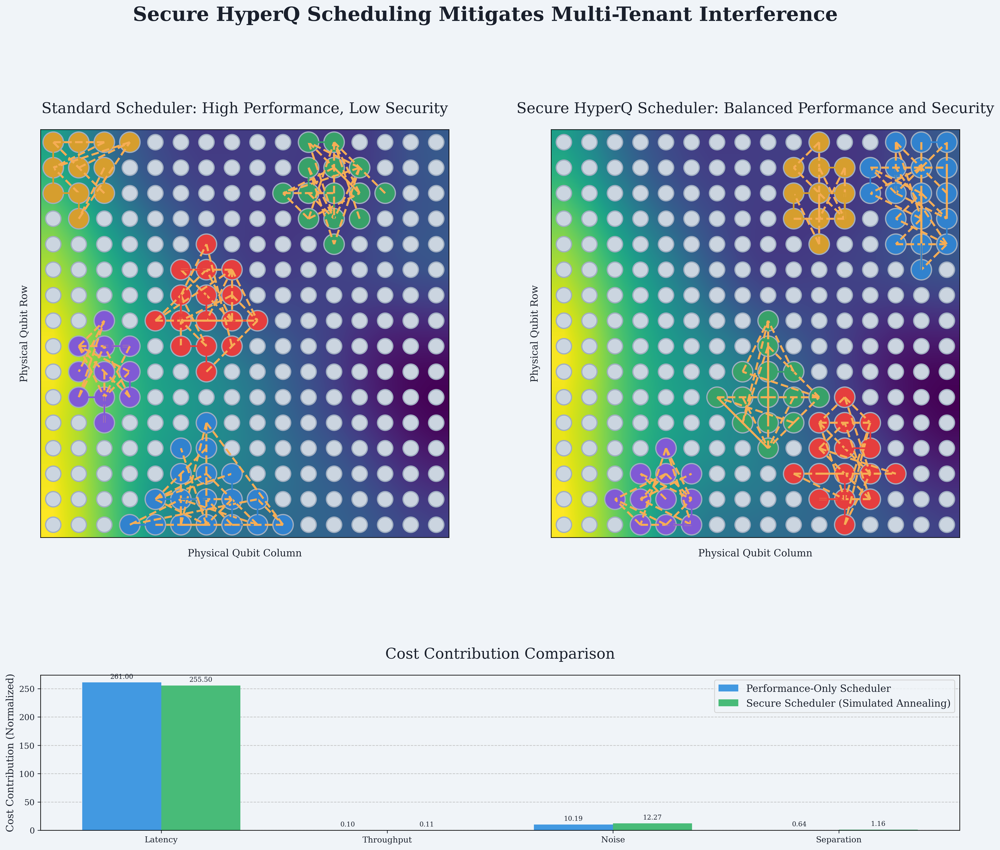

In [11]:
!pip install numpy matplotlib networkx scipy

import os
import sys
import time
import math
import random
import logging
from typing import (
    List, Dict, Tuple, Optional, Any, Set, NamedTuple, Callable, Generator, Iterable
)
from dataclasses import dataclass, field


try:
    import numpy as np
    import networkx as nx
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    from matplotlib.patches import Circle, Rectangle
    from matplotlib.colors import LinearSegmentedColormap, ListedColormap, Normalize
    from scipy.spatial.distance import cdist
    from scipy.ndimage import gaussian_filter
except ImportError as e:
    print(f"Error: Missing required library. {e}")
    print("Please install the necessary packages by running:")
    print("pip install numpy matplotlib networkx scipy")
    sys.exit(1)


def perlin_noise_2d(shape, scale, octaves, persistence, lacunarity, seed):

    rows, cols = shape
    result = np.zeros(shape)

    np.random.seed(seed)
    gradients = np.random.rand(rows + 1, cols + 1, 2) * 2 - 1

    for i in range(rows):
        for j in range(cols):
            x = i / scale
            y = j / scale
            
            total_noise = 0
            amplitude = 1
            frequency = 1
            
            for _ in range(octaves):
                ix = int(np.floor(x * frequency))
                iy = int(np.floor(y * frequency))
                fx = (x * frequency) - ix
                fy = (y * frequency) - iy
                

                u = fx * fx * (3 - 2 * fx)
                v = fy * fy * (3 - 2 * fy)

                grad00 = gradients[ix % (rows + 1), iy % (cols + 1)]
                grad10 = gradients[(ix + 1) % (rows + 1), iy % (cols + 1)]
                grad01 = gradients[ix % (rows + 1), (iy + 1) % (cols + 1)]
                grad11 = gradients[(ix + 1) % (rows + 1), (iy + 1) % (cols + 1)]
                
                dot00 = np.dot(grad00, (fx, fy))
                dot10 = np.dot(grad10, (fx - 1, fy))
                dot01 = np.dot(grad01, (fx, fy - 1))
                dot11 = np.dot(grad11, (fx - 1, fy - 1))
                
                interp_x1 = dot00 + u * (dot10 - dot00)
                interp_x2 = dot01 + u * (dot11 - dot01)
                
                total_noise += (interp_x1 + v * (interp_x2 - interp_x1)) * amplitude
                
                amplitude *= persistence
                frequency *= lacunarity

            result[i, j] = total_noise


    min_val, max_val = result.min(), result.max()
    if max_val == min_val:
        return np.zeros_like(result)
    return (result - min_val) / (max_val - min_val)


SETTINGS = {

    "logging": {
        "level": logging.INFO,
        "format": "%(asctime)s - [%(levelname)s] - %(message)s",
        "datefmt": "%Y-%m-%d %H:%M:%S",
    },

    "simulation": {
        "seed": 42,  
        "num_runs": 1,
    },

    "device": {
        "rows": 16,
        "cols": 16,
        "topology": "grid", 
        "noise_model": {
            "type": "perlin",
            "scale": 30.0,
            "octaves": 6,
            "persistence": 0.5,
            "lacunarity": 2.0,
            "base": 0,
            "min_noise": 0.01, 
            "max_noise": 0.25, 
            "smoothing_sigma": 1.2, 
        },
    },

    "workload": {
        "num_tenants": 5,
        "min_qubits_per_tenant": 8,
        "max_qubits_per_tenant": 20,
        "min_circuit_depth": 10,
        "max_circuit_depth": 50,
  
        "internal_connectivity_factor": 1.5,
    },

    "cost_weights": {

        "performance_only": {
            "lambda1_latency": 1.0,
            "lambda2_throughput": 1.0,
            "lambda3_noise": 0.0,     
            "lambda4_separation": 0.0, 
        },

        "secure": {
            "lambda1_latency": 0.6,
            "lambda2_throughput": 0.5,
            "lambda3_noise": 1.5,      
            "lambda4_separation": 2.0, 
        },

        "beta_swap_penalty": 0.5, 
        "xi_separation_strength": 1.0, 
        "alpha_separation_decay": 0.7,
    },

    "simulated_annealing": {
        "initial_temp": 1000.0,
        "final_temp": 0.1,
        "cooling_rate": 0.995, 
        "steps_per_temp": 150,
        "max_perturbation_distance": 4, 
    },

    "visualization": {
        "dpi": 300,
        "figure_size": (20, 16),
        "title": "Secure HyperQ Scheduling Mitigates Multi-Tenant Interference",
        "font_family": "serif",
        "title_fontsize": 24,
        "subtitle_fontsize": 18,
        "label_fontsize": 12,
        "tick_fontsize": 10,
        "legend_fontsize": 12,

        "colors": {
            "background": "#F0F4F8",
            "text": "#1A202C",
            "border": "#A0AEC0",
            "qubit_idle": "#CBD5E0",
            "qubit_coupler": "#718096",
            "tenant_palette": [
                "#3182CE", "#E53E3E", "#38A169", "#D69E2E", "#805AD5",
                "#319795", "#DD6B20", "#ED64A6",
            ],
            "crosstalk_aura": "#F56565",
            "swap_link": "#F6AD55",
            "noise_map_cmap": "viridis_r", 
            "bar_chart": {
                "performance": "#4299E1",
                "secure": "#48BB78",
                "text": "#FFFFFF",
            },
        },

        "node_size": 150,
        "node_border_width": 1.5,
        "coupler_width": 2.0,

        "aura_max_radius": 2.5, 
        "aura_base_alpha": 0.08,

        "swap_link_width": 2.5,
        "swap_link_style": "dashed",
    },
}


def setup_logging():

    log_config = SETTINGS["logging"]
    logging.basicConfig(
        level=log_config["level"],
        format=log_config["format"],
        datefmt=log_config["datefmt"],
    )
    logging.info("Logger initialized.")


@dataclass(frozen=True)
class QuantumDevice:

    rows: int
    cols: int
    graph: nx.Graph = field(repr=False)
    noise_map: Dict[Tuple[int, int], float] = field(repr=False)
    shortest_paths: Dict[Any, Dict[Any, int]] = field(repr=False)

    @property
    def num_qubits(self) -> int:

        return len(self.graph.nodes)

    def get_qubit_distance(self, q1: Tuple[int, int], q2: Tuple[int, int]) -> int:

        if q1 not in self.shortest_paths or q2 not in self.shortest_paths[q1]:
            raise ValueError(f"Distance not available between {q1} and {q2}")
        return self.shortest_paths[q1][q2]


@dataclass(frozen=True)
class Tenant:

    id: int
    num_qubits: int
    circuit_depth: int
    internal_graph: nx.Graph = field(repr=False)


@dataclass
class Placement:

    tenant: Tenant
    qubits: Set[Tuple[int, int]]


@dataclass
class CostBreakdown:

    latency: float = 0.0
    throughput: float = 0.0
    noise: float = 0.0
    separation: float = 0.0
    total: float = 0.0


class SimulationResult(NamedTuple):

    scheduler_name: str
    placements: List[Placement]
    costs: CostBreakdown
    execution_time: float


class HardwareGenerator:

    @staticmethod
    def create_device() -> QuantumDevice:

        logging.info("Generating quantum device hardware...")
        device_config = SETTINGS["device"]
        rows, cols = device_config["rows"], device_config["cols"]


        logging.debug(f"Creating a {rows}x{cols} grid graph.")
        graph = nx.grid_2d_graph(rows, cols)
        nodes = list(graph.nodes())


        logging.debug("Generating hardware noise map.")
        noise_map = HardwareGenerator._generate_noise_map(rows, cols, nodes)


        logging.debug("Pre-calculating all-pairs shortest paths...")

        path_lengths = dict(nx.all_pairs_shortest_path_length(graph))
        logging.debug("Shortest paths calculation complete.")

        device = QuantumDevice(
            rows=rows,
            cols=cols,
            graph=graph,
            noise_map=noise_map,
            shortest_paths=path_lengths,
        )
        logging.info(f"Quantum device generated with {device.num_qubits} qubits.")
        return device

    @staticmethod
    def _generate_noise_map(rows: int, cols: int, nodes: List[Tuple[int, int]]) -> Dict[Tuple[int, int], float]:

        noise_config = SETTINGS["device"]["noise_model"]
        noise_type = noise_config["type"]
        logging.info(f"Using '{noise_type}' noise model.")

        raw_noise = np.zeros((rows, cols))

        if noise_type == "perlin":
            scale = noise_config["scale"]
            octaves = noise_config["octaves"]
            persistence = noise_config["persistence"]
            lacunarity = noise_config["lacunarity"]
            seed = SETTINGS["simulation"]["seed"]

            raw_noise = perlin_noise_2d(
                (rows, cols),
                scale=scale,
                octaves=octaves,
                persistence=persistence,
                lacunarity=lacunarity,
                seed=seed,
            )
        elif noise_type == "uniform":
             raw_noise = np.random.rand(rows, cols)
        else: 
            raw_noise = np.random.randn(rows, cols)

        smoothed_noise = gaussian_filter(raw_noise, sigma=noise_config["smoothing_sigma"])


        min_val, max_val = smoothed_noise.min(), smoothed_noise.max()
        if max_val == min_val: 
            normalized_noise = np.zeros_like(smoothed_noise)
        else:
            normalized_noise = (smoothed_noise - min_val) / (max_val - min_val)


        min_noise = noise_config["min_noise"]
        max_noise = noise_config["max_noise"]
        final_noise_values = min_noise + normalized_noise * (max_noise - min_noise)

        noise_map = {node: float(final_noise_values[node[0], node[1]]) for node in nodes}
        return noise_map


class WorkloadGenerator:

    @staticmethod
    def create_workload() -> List[Tenant]:

        logging.info("Generating multi-tenant workload...")
        workload_config = SETTINGS["workload"]
        num_tenants = workload_config["num_tenants"]
        tenants = []

        for i in range(num_tenants):
            tenant_id = i + 1
            num_qubits = random.randint(
                workload_config["min_qubits_per_tenant"],
                workload_config["max_qubits_per_tenant"],
            )
            circuit_depth = random.randint(
                workload_config["min_circuit_depth"],
                workload_config["max_circuit_depth"],
            )


            internal_graph = nx.gnm_random_graph(
                num_qubits,
                int(num_qubits * workload_config["internal_connectivity_factor"]),
            )
            

            if not nx.is_connected(internal_graph):
                components = list(nx.connected_components(internal_graph))
                for j in range(len(components) - 1):
                    u = random.choice(list(components[j]))
                    v = random.choice(list(components[j+1]))
                    internal_graph.add_edge(u, v)

            tenant = Tenant(
                id=tenant_id,
                num_qubits=num_qubits,
                circuit_depth=circuit_depth,
                internal_graph=internal_graph,
            )
            tenants.append(tenant)
            logging.debug(
                f"Generated Tenant {tenant.id}: {tenant.num_qubits} qubits, "
                f"depth {tenant.circuit_depth}."
            )
        
        logging.info(f"Generated a workload with {len(tenants)} tenants.")
        return tenants



class CostCalculator:

    def __init__(self, device: QuantumDevice, cost_weights: Dict[str, float]):

        self.device = device
        self.weights = cost_weights
        self.params = SETTINGS["cost_weights"]
        logging.debug("CostCalculator initialized with weights: %s", self.weights)

    def calculate_all_costs(self, placements: List[Placement]) -> CostBreakdown:

        latency = self._calculate_latency_cost(placements)
        throughput = self._calculate_throughput_cost(placements)
        noise = self._calculate_noise_cost(placements)
        separation = self._calculate_separation_cost(placements)

        total_cost = (
            self.weights["lambda1_latency"] * latency +
            self.weights["lambda2_throughput"] * throughput +
            self.weights["lambda3_noise"] * noise +
            self.weights["lambda4_separation"] * separation
        )

        return CostBreakdown(
            latency=latency,
            throughput=throughput,
            noise=noise,
            separation=separation,
            total=total_cost,
        )

    def _calculate_latency_cost(self, placements: List[Placement]) -> float:

        total_latency_cost = 0.0
        for p in placements:
            circuit_depth = p.tenant.circuit_depth
            

            swap_count = 0
            logical_qubit_map = {i: qubit for i, qubit in enumerate(p.qubits)}
            
            for u_logic, v_logic in p.tenant.internal_graph.edges():
                u_phys = logical_qubit_map.get(u_logic)
                v_phys = logical_qubit_map.get(v_logic)
                if u_phys and v_phys:
                    dist = self.device.get_qubit_distance(u_phys, v_phys)
                    if dist > 1:

                        swap_count += (dist - 1)

            latency_for_tenant = circuit_depth + self.params["beta_swap_penalty"] * swap_count
            total_latency_cost += latency_for_tenant
        
        return total_latency_cost

    def _calculate_throughput_cost(self, placements: List[Placement]) -> float:

        total_throughput_cost = 0.0

        for p in placements:
            circuit_depth = p.tenant.circuit_depth
            swap_count = 0
            logical_qubit_map = {i: qubit for i, qubit in enumerate(p.qubits)}
            for u_logic, v_logic in p.tenant.internal_graph.edges():
                u_phys = logical_qubit_map.get(u_logic)
                v_phys = logical_qubit_map.get(v_logic)
                if u_phys and v_phys:
                    dist = self.device.get_qubit_distance(u_phys, v_phys)
                    if dist > 1:
                        swap_count += (dist - 1)
            

            exec_time = circuit_depth + self.params["beta_swap_penalty"] * swap_count
            
            if exec_time > 1e-9: 
                total_throughput_cost -= (1.0 / exec_time)

        return total_throughput_cost

    def _calculate_noise_cost(self, placements: List[Placement]) -> float:

        total_noise_cost = 0.0
        for p in placements:
            for qubit in p.qubits:
                total_noise_cost += self.device.noise_map[qubit]
        return total_noise_cost

    def _calculate_separation_cost(self, placements: List[Placement]) -> float:

        total_separation_cost = 0.0
        num_placements = len(placements)

        if num_placements < 2:
            return 0.0


        placement_coords = [np.array(list(p.qubits)) for p in placements]

        for i in range(num_placements):
            for j in range(i + 1, num_placements):

                dist_matrix = cdist(placement_coords[i], placement_coords[j], 'cityblock')
                min_dist = np.min(dist_matrix)


                delta_kl = min_dist


                cost_pair = self.params["xi_separation_strength"] * math.exp(
                    -self.params["alpha_separation_decay"] * delta_kl
                )
                total_separation_cost += cost_pair
        
        return total_separation_cost


class BaseScheduler:

    def __init__(self, device: QuantumDevice, tenants: List[Tenant], cost_weights_name: str):

        self.device = device
        self.tenants = tenants
        self.cost_weights_name = cost_weights_name
        self.cost_calculator = CostCalculator(
            device, SETTINGS["cost_weights"][cost_weights_name]
        )
        self.name = "Base Scheduler"

    def run(self) -> SimulationResult:

        logging.info(f"--- Running {self.name} ---")
        start_time = time.time()
        
        placements = self._schedule()

        end_time = time.time()
        execution_time = end_time - start_time
        
        logging.info("Calculating final costs for the placement...")
        final_costs = self.cost_calculator.calculate_all_costs(placements)
        
        logging.info(f"{self.name} finished in {execution_time:.4f} seconds.")
        logging.info(f"Final cost ({self.cost_weights_name} weights): {final_costs.total:.4f}")
        logging.info(f"  - Latency Cost: {final_costs.latency:.4f}")
        logging.info(f"  - Throughput Cost: {final_costs.throughput:.4f}")
        logging.info(f"  - Noise Cost: {final_costs.noise:.4f}")
        logging.info(f"  - Separation Cost: {final_costs.separation:.4f}")

        return SimulationResult(
            scheduler_name=self.name,
            placements=placements,
            costs=final_costs,
            execution_time=execution_time,
        )

    def _schedule(self) -> List[Placement]:

        raise NotImplementedError("Subclasses must implement the _schedule method.")


class PerformanceOnlyScheduler(BaseScheduler):

    def __init__(self, device: QuantumDevice, tenants: List[Tenant]):
        super().__init__(device, tenants, "performance_only")
        self.name = "Performance-Only Scheduler"

    def _schedule(self) -> List[Placement]:

        placements = []
        occupied_qubits: Set[Tuple[int, int]] = set()


        sorted_tenants = sorted(self.tenants, key=lambda t: t.num_qubits, reverse=True)
        all_qubits = list(self.device.graph.nodes())
        random.shuffle(all_qubits)

        for tenant in sorted_tenants:
            logging.debug(f"Attempting to place Tenant {tenant.id} ({tenant.num_qubits} qubits).")

            placement_found = False
            for start_node in all_qubits:
                if start_node not in occupied_qubits:

                    block = self._find_contiguous_block(start_node, tenant.num_qubits, occupied_qubits)
                    if block is not None:
                        new_placement = Placement(tenant=tenant, qubits=block)
                        placements.append(new_placement)
                        occupied_qubits.update(block)
                        logging.debug(f"Placed Tenant {tenant.id} at block starting near {start_node}.")
                        placement_found = True
                        break 

            if not placement_found:
                logging.warning(f"Could not place Tenant {tenant.id}. Not enough contiguous space.")
                return placements
        return placements

    def _find_contiguous_block(self, start_node: Tuple[int, int], size: int, occupied: Set[Tuple[int, int]]) -> Optional[Set[Tuple[int, int]]]:

        if start_node in occupied:
            return None
        
        q = [start_node]
        block: Set[Tuple[int, int]] = {start_node}
        visited = {start_node}
        
        while q:
            current = q.pop(0)
            if len(block) == size:
                return block
            

            for neighbor in self.device.graph.neighbors(current):
                if neighbor not in visited and neighbor not in occupied:
                    visited.add(neighbor)
                    block.add(neighbor)
                    q.append(neighbor)
                    if len(block) == size:
                        return block
        
        return None 


class SecureScheduler(BaseScheduler):

    def __init__(self, device: QuantumDevice, tenants: List[Tenant]):
        super().__init__(device, tenants, "secure")
        self.name = "Secure Scheduler (Simulated Annealing)"
        self.sa_config = SETTINGS["simulated_annealing"]

    def _schedule(self) -> List[Placement]:


        logging.info("Generating initial state for Simulated Annealing...")
        perf_scheduler = PerformanceOnlyScheduler(self.device, self.tenants)
        initial_placements = perf_scheduler._schedule()
        if not initial_placements:
            logging.error("Could not generate a valid initial placement. Aborting.")
            return []
        
        current_state = initial_placements
        current_cost = self.cost_calculator.calculate_all_costs(current_state).total
        best_state = current_state
        best_cost = current_cost
        
        temp = self.sa_config["initial_temp"]
        final_temp = self.sa_config["final_temp"]
        cooling_rate = self.sa_config["cooling_rate"]
        
        logging.info(f"Starting Simulated Annealing. Initial cost: {current_cost:.4f}")


        while temp > final_temp:
            for _ in range(self.sa_config["steps_per_temp"]):

                neighbor_state = self._get_neighbor_state(current_state)
                if neighbor_state is None:
                    continue
                

                neighbor_cost = self.cost_calculator.calculate_all_costs(neighbor_state).total
                

                cost_delta = neighbor_cost - current_cost

                if cost_delta < 0 or random.random() < math.exp(-cost_delta / temp):
                    current_state = neighbor_state
                    current_cost = neighbor_cost
                

                if current_cost < best_cost:
                    best_state = current_state
                    best_cost = current_cost
            

            temp *= cooling_rate
            logging.debug(f"Temp: {temp:.2f}, Current Cost: {current_cost:.4f}, Best Cost: {best_cost:.4f}")

        logging.info(f"Simulated Annealing finished. Best cost found: {best_cost:.4f}")
        return best_state

    def _get_neighbor_state(self, placements: List[Placement]) -> Optional[List[Placement]]:

        if not placements:
            return None


        new_placements = [Placement(p.tenant, p.qubits.copy()) for p in placements]


        tenant_to_move_idx = random.randrange(len(new_placements))
        placement_to_move = new_placements.pop(tenant_to_move_idx)
        tenant = placement_to_move.tenant


        occupied_by_others = set()
        for p in new_placements:
            occupied_by_others.update(p.qubits)

        old_centroid = np.mean(np.array(list(placement_to_move.qubits)), axis=0)
        max_dist = self.sa_config["max_perturbation_distance"]


        all_qubits = list(self.device.graph.nodes())
        potential_starts = sorted(all_qubits, key=lambda q: np.linalg.norm(np.array(q) - old_centroid))

        for start_node in potential_starts:

            if np.linalg.norm(np.array(start_node) - old_centroid) > max_dist * 2:
                break
            

            if start_node not in occupied_by_others:

                block_finder = PerformanceOnlyScheduler(self.device, [])
                new_block = block_finder._find_contiguous_block(
                    start_node, tenant.num_qubits, occupied_by_others
                )
                if new_block is not None:

                    new_placement = Placement(tenant, new_block)
                    new_placements.insert(tenant_to_move_idx, new_placement)
                    return new_placements 


        return None 



class VisualizationEngine:

    def __init__(self, device: QuantumDevice, perf_result: SimulationResult, secure_result: SimulationResult):

        self.device = device
        self.perf_result = perf_result
        self.secure_result = secure_result
        self.config = SETTINGS["visualization"]
        self.colors = self.config["colors"]
        

        plt.style.use('default')
        plt.rcParams['font.family'] = self.config["font_family"]
        plt.rcParams['text.color'] = self.colors["text"]
        plt.rcParams['axes.labelcolor'] = self.colors["text"]
        plt.rcParams['xtick.color'] = self.colors["text"]
        plt.rcParams['ytick.color'] = self.colors["text"]
        plt.rcParams['axes.facecolor'] = self.colors["background"]
        plt.rcParams['savefig.facecolor'] = self.colors["background"]
        plt.rcParams['figure.facecolor'] = self.colors["background"]
        
        logging.info("Visualization Engine initialized.")

    def generate_figure(self):

        fig = plt.figure(figsize=self.config["figure_size"], dpi=self.config["dpi"])
        gs = gridspec.GridSpec(2, 2, height_ratios=[3, 1], width_ratios=[1, 1], hspace=0.35, wspace=0.25)


        ax1 = fig.add_subplot(gs[0, 0])
        self._plot_scheduler_result(ax1, self.perf_result)
        ax1.set_title("Standard Scheduler: High Performance, Low Security",
                      fontsize=self.config["subtitle_fontsize"], pad=20)

        ax2 = fig.add_subplot(gs[0, 1])
        self._plot_scheduler_result(ax2, self.secure_result)
        ax2.set_title("Secure HyperQ Scheduler: Balanced Performance and Security",
                      fontsize=self.config["subtitle_fontsize"], pad=20)


        ax3 = fig.add_subplot(gs[1, :])
        self._plot_cost_comparison(ax3, self.perf_result, self.secure_result)


        fig.suptitle(self.config["title"],
                     fontsize=self.config["title_fontsize"],
                     fontweight='bold',
                     y=0.98)




    def _plot_scheduler_result(self, ax: plt.Axes, result: SimulationResult):


        rows, cols = self.device.rows, self.device.cols
        

        ax.set_aspect('equal', adjustable='box')
        ax.set_xlim(-0.5, cols - 0.5)
        ax.set_ylim(-0.5, rows - 0.5)
        ax.invert_yaxis()
        

        ax.set_xticks(np.arange(cols))
        ax.set_yticks(np.arange(rows))
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.tick_params(axis='both', which='both', length=0)
        

        self._plot_noise_map(ax)
        

        tenant_palette = self.colors["tenant_palette"]
        tenant_colors = {
            t.tenant.id: tenant_palette[i % len(tenant_palette)]
            for i, t in enumerate(result.placements)
        }
        

        for qubit in self.device.graph.nodes():
            ax.add_patch(Circle(qubit[::-1], radius=0.3, facecolor=self.colors["qubit_idle"],
                                edgecolor=self.colors["border"], linewidth=self.config["node_border_width"]))
        

        for p in result.placements:
            tenant_color = tenant_colors.get(p.tenant.id, '#000000')
            

            for qubit in p.qubits:
                ax.add_patch(Circle(qubit[::-1], radius=0.4, facecolor=tenant_color,
                                    edgecolor=self.colors["border"], linewidth=self.config["node_border_width"]))
            

            self._plot_crosstalk_aura(ax, p, tenant_color)
            

            self._plot_tenant_links(ax, p, tenant_color)
            

        for edge in self.device.graph.edges():
            if not self._is_edge_occupied(edge, result.placements):
                ax.plot([edge[0][1], edge[1][1]], [edge[0][0], edge[1][0]],
                        color=self.colors["qubit_coupler"], linewidth=self.config["coupler_width"], zorder=-1)
        
        ax.set_xlabel("Physical Qubit Column", fontsize=self.config["label_fontsize"], labelpad=10)
        ax.set_ylabel("Physical Qubit Row", fontsize=self.config["label_fontsize"], labelpad=10)

    def _is_edge_occupied(self, edge, placements):

        for p in placements:
            if edge[0] in p.qubits and edge[1] in p.qubits:
                return True
        return False

    def _plot_noise_map(self, ax: plt.Axes):

        noise_array = np.zeros((self.device.rows, self.device.cols))
        for (r, c), noise_val in self.device.noise_map.items():
            noise_array[r, c] = noise_val
        

        ax.imshow(noise_array, cmap=self.config["colors"]["noise_map_cmap"],
                  interpolation='bilinear', origin='upper', extent=(-0.5, self.device.cols-0.5, self.device.rows-0.5, -0.5))

    def _plot_crosstalk_aura(self, ax: plt.Axes, placement: Placement, color: str):

        qubit_coords = np.array(list(placement.qubits))
        

        if qubit_coords.shape[0] > 0:
            centroid = np.mean(qubit_coords, axis=0)
            max_dist = np.max(cdist(qubit_coords, [centroid]))
            radius = max_dist + self.config["aura_max_radius"]
            

            ax.add_patch(Circle(centroid[::-1], radius=radius,
                                color=color, alpha=self.config["aura_base_alpha"], zorder=-2))

    def _plot_tenant_links(self, ax: plt.Axes, placement: Placement, color: str):

        logical_qubit_map = {i: qubit for i, qubit in enumerate(placement.qubits)}
        
        for u_logic, v_logic in placement.tenant.internal_graph.edges():
            u_phys = logical_qubit_map.get(u_logic)
            v_phys = logical_qubit_map.get(v_logic)
            
            if u_phys and v_phys:
                dist = self.device.get_qubit_distance(u_phys, v_phys)
                is_swap = dist > 1
                
                linestyle = self.config["swap_link_style"] if is_swap else "solid"
                linewidth = self.config["swap_link_width"] if is_swap else self.config["coupler_width"]
                
                ax.plot([u_phys[1], v_phys[1]], [u_phys[0], v_phys[0]],
                        color=self.colors["swap_link"] if is_swap else color,
                        linestyle=linestyle,
                        linewidth=linewidth)

    def _plot_cost_comparison(self, ax: plt.Axes, perf_result: SimulationResult, secure_result: SimulationResult):

        cost_labels = ["Latency", "Throughput", "Noise", "Separation"]
        perf_costs = [
            perf_result.costs.latency,
            abs(perf_result.costs.throughput),
            perf_result.costs.noise,
            perf_result.costs.separation,
        ]
        secure_costs = [
            secure_result.costs.latency,
            abs(secure_result.costs.throughput),
            secure_result.costs.noise,
            secure_result.costs.separation,
        ]

        x_pos = np.arange(len(cost_labels))
        width = 0.35


        perf_bars = ax.bar(x_pos - width/2, perf_costs, width,
                           label=perf_result.scheduler_name,
                           color=self.colors["bar_chart"]["performance"])


        secure_bars = ax.bar(x_pos + width/2, secure_costs, width,
                             label=secure_result.scheduler_name,
                             color=self.colors["bar_chart"]["secure"])


        def autolabel(bars):
            for bar in bars:
                height = bar.get_height()
                ax.annotate(f'{height:.2f}',
                            xy=(bar.get_x() + bar.get_width() / 2, height),
                            xytext=(0, 3),  
                            textcoords="offset points",
                            ha='center', va='bottom',
                            fontsize=8)

        autolabel(perf_bars)
        autolabel(secure_bars)

        ax.set_ylabel("Cost Contribution (Normalized)", fontsize=self.config["label_fontsize"])
        ax.set_xticks(x_pos)
        ax.set_xticklabels(cost_labels, fontsize=self.config["tick_fontsize"])
        ax.set_title("Cost Contribution Comparison", fontsize=self.config["subtitle_fontsize"], pad=20)
        ax.legend(fontsize=self.config["legend_fontsize"])
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        ax.set_axisbelow(True)

def main():


    setup_logging()
    logging.info("Starting Secure HyperQ Simulation and Visualization.")
    random.seed(SETTINGS["simulation"]["seed"])
    np.random.seed(SETTINGS["simulation"]["seed"])
    

    device = HardwareGenerator.create_device()
    tenants = WorkloadGenerator.create_workload()


    total_qubits_requested = sum(t.num_qubits for t in tenants)
    if total_qubits_requested > device.num_qubits:
        logging.error(
            f"Workload is infeasible. Requested {total_qubits_requested} qubits, "
            f"but device only has {device.num_qubits}. Exiting."
        )
        return

    perf_scheduler = PerformanceOnlyScheduler(device, tenants)
    perf_result = perf_scheduler.run()


    secure_scheduler = SecureScheduler(device, tenants)
    secure_result = secure_scheduler.run()
    

    if perf_result and secure_result:
        visualizer = VisualizationEngine(device, perf_result, secure_result)
        visualizer.generate_figure()
    else:
        logging.error("One or more schedulers failed to produce a result. Aborting visualization.")

if __name__ == "__main__":
    main()